In [1]:
import mdtraj as md
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import math
from numpy import log2, zeros, mean, var, sum, loadtxt, arange, \
                  array, cumsum, dot, transpose, diagonal, floor
from numpy.linalg import inv, lstsq

https://figshare.com/articles/dataset/Microsecond_molecular_dynamics_simulation_of_kinase_domain_of_the_human_tyrosine_kinase_ABL1/4496795/1

This is a one microsecond trajectory of the catalytic domain of the human tyrosine protein kinase ABL1 (UNIPROT:ABL1_HUMAN, residues 242-493). The simulation was generated on Folding@home using OpenMM 6.3.1 with the AMBER99SB-ILDN forcefield, TIP3P water, and neutralizing salt. A Langevin integrator with 2 fs timestep, 300 K temperature, and 1/ps collision rate was used. PME with a nonbonded cutoff of 1.0 nm was used with default tolerance of 5.0e-4. A long-range isotropic dispersion correction was used to correct for the truncation of Lennard-Jones interactions at 1.0 nm. A molecular-scaling Monte Carlo barostat was applied using a 1 atm reference pressure, with MC moves attempted every 50 steps. Coordinates were saved every 250ps, and waters and ions stripped. The trajectory file contains 4000 snapshots. Initial models were generated with Ensembler (see References) using the ABL1 structure from chain B of PDB ID: 2GQG as a template.

https://www.rcsb.org/structure/2GQG

Trajetories and pdb can be downloaded here:
https://www.dropbox.com/s/qymy39ak2apqd75/ABL1.zip?dl=0


In [2]:
pdb='/Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/ABL1/ABL1.pdb'
trajectory='/Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/ABL1/ABL1.dcd'
outdir='/Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/outdir'
if not os.path.exists('outdir'):
    os.makedirs('outdir')
    
print("outdir:",outdir)
print("pdb:",pdb)
print("trjaectory:",trajectory)

outdir: /Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/outdir
pdb: /Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/ABL1/ABL1.pdb
trjaectory: /Users/Vaishnavi_Home/Documents/College/Fourth Year/Spring/CHEM101/Project_2/ABL1/ABL1.dcd


In [3]:
trj = md.load(trajectory, top=pdb,stride=1)
trj.center_coordinates()
top = trj.topology
first_frame = 0
last_frame = trj.n_frames
n_frames=trj.n_frames

In [4]:
nres=[]
nres = [res.resSeq for res in trj.top.residues]
sequence=[residue for residue in trj.topology.residues]
resname=[residue.name for residue in trj.topology.residues]
resindex=[residue.index for residue in trj.topology.residues]
res_num=[residue.resSeq  for residue in trj.topology.residues]
#turning these into arrays so it's easier to index into them later on

#log = open("/Users/paulrobustelli/Desktop/Sa_calc.log", "w")
print("** SYSTEM INFO **\n")
print("Number of atoms: %d\n" % trj.n_atoms)
print("Number of residues: %d\n" % len(set(nres)))
print("Number of frames: %d\n" % trj.n_frames)
print("Starting frame: %d\n" % first_frame)
print("Last frame: %d\n" % last_frame)
print("sequence: %s\n" % sequence)
print("residue names: %s\n" % resname)
print("residue number: %s\n" % res_num)
print("residue index: %s\n" % resindex)

#this syntax adds in the variable to the string when printing 

** SYSTEM INFO **

Number of atoms: 4062

Number of residues: 252

Number of frames: 4000

Starting frame: 0

Last frame: 4000

sequence: [ILE242, THR243, MET244, LYS245, HIS246, LYS247, LEU248, GLY249, GLY250, GLY251, GLN252, TYR253, GLY254, GLU255, VAL256, TYR257, GLU258, GLY259, VAL260, TRP261, LYS262, LYS263, TYR264, SER265, LEU266, THR267, VAL268, ALA269, VAL270, LYS271, THR272, LEU273, LYS274, GLU275, ASP276, THR277, MET278, GLU279, VAL280, GLU281, GLU282, PHE283, LEU284, LYS285, GLU286, ALA287, ALA288, VAL289, MET290, LYS291, GLU292, ILE293, LYS294, HIS295, PRO296, ASN297, LEU298, VAL299, GLN300, LEU301, LEU302, GLY303, VAL304, CYS305, THR306, ARG307, GLU308, PRO309, PRO310, PHE311, TYR312, ILE313, ILE314, THR315, GLU316, PHE317, MET318, THR319, TYR320, GLY321, ASN322, LEU323, LEU324, ASP325, TYR326, LEU327, ARG328, GLU329, CYS330, ASN331, ARG332, GLN333, GLU334, VAL335, ASN336, ALA337, VAL338, VAL339, LEU340, LEU341, TYR342, MET343, ALA344, THR345, GLN346, ILE347, SER348, SER34

In [5]:
residue_num=[]
for res in top.residues: 
    residue_num.append(res.resSeq)
residue_id=np.asarray(residue_num)
residue_id


array([242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254,
       255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267,
       268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280,
       281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293,
       294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306,
       307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319,
       320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332,
       333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345,
       346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358,
       359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371,
       372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384,
       385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397,
       398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410,
       411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 42

In [6]:
#Use DSSP to calculate the secondary structure definition
#https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html
dssp=md.compute_dssp(trj,simplified=True)
dssp

#give energy of a hydrogen bond, looks at dihedral angles, and then figures out what the structures are like 
#gives the type of structure 

array([['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'H', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ...,
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C']], dtype='<U2')

In [7]:
print(dssp.shape)
print("Rows:",len(dssp))
print("Columns:",len(dssp[0]))

#Print out helix and beta residues for a given frame
frame=0
dssp_frame=np.column_stack((residue_id,dssp[frame]))
helix_res=np.where(dssp_frame[:,1]=='H')
beta_res=np.where(dssp_frame[:,1]=='E')
print('helical residues:',dssp_frame[helix_res])
print('beta residues:',dssp_frame[beta_res])

(4000, 252)
Rows: 4000
Columns: 252
helical residues: [['280' 'H']
 ['281' 'H']
 ['282' 'H']
 ['283' 'H']
 ['284' 'H']
 ['285' 'H']
 ['286' 'H']
 ['287' 'H']
 ['288' 'H']
 ['289' 'H']
 ['323' 'H']
 ['324' 'H']
 ['325' 'H']
 ['326' 'H']
 ['327' 'H']
 ['337' 'H']
 ['338' 'H']
 ['339' 'H']
 ['340' 'H']
 ['341' 'H']
 ['342' 'H']
 ['343' 'H']
 ['344' 'H']
 ['345' 'H']
 ['346' 'H']
 ['347' 'H']
 ['348' 'H']
 ['349' 'H']
 ['350' 'H']
 ['351' 'H']
 ['352' 'H']
 ['353' 'H']
 ['354' 'H']
 ['355' 'H']
 ['356' 'H']
 ['357' 'H']
 ['366' 'H']
 ['367' 'H']
 ['368' 'H']
 ['373' 'H']
 ['374' 'H']
 ['375' 'H']
 ['403' 'H']
 ['404' 'H']
 ['405' 'H']
 ['408' 'H']
 ['409' 'H']
 ['410' 'H']
 ['411' 'H']
 ['412' 'H']
 ['413' 'H']
 ['420' 'H']
 ['421' 'H']
 ['422' 'H']
 ['423' 'H']
 ['424' 'H']
 ['425' 'H']
 ['426' 'H']
 ['427' 'H']
 ['428' 'H']
 ['429' 'H']
 ['430' 'H']
 ['431' 'H']
 ['432' 'H']
 ['433' 'H']
 ['449' 'H']
 ['450' 'H']
 ['451' 'H']
 ['452' 'H']
 ['453' 'H']
 ['466' 'H']
 ['467' 'H']
 ['468' 'H

(250.0, 400.0)

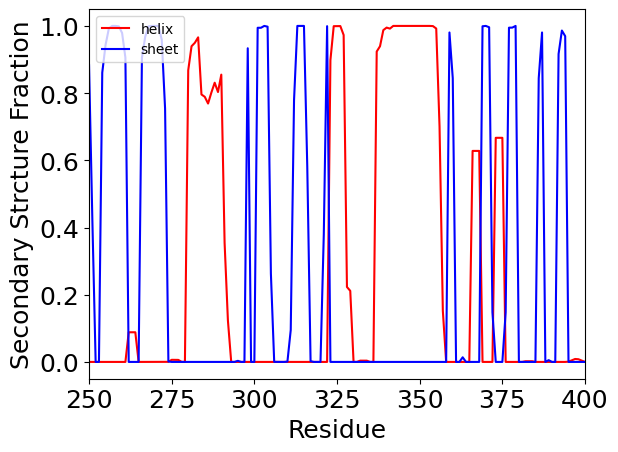

In [8]:
dssp=md.compute_dssp(trj,simplified=True)

def dssp_convert(dssp):
 dsspH=np.copy(dssp)
 dsspE=np.copy(dssp)
 dsspH[dsspH=='H']=1                                                                                      
 dsspH[dsspH=='E']=0                                                                                      
 dsspH[dsspH=='C']=0                                                                                      
 dsspH[dsspH=='NA']=0  
    #makes array of 1s 0s for if helix or not, each column an amino acid, each row a frame 
    #sum each column and helical propensity is divided by #frames 
 dsspH=dsspH.astype(int)
 TotalH=np.sum(dsspH,axis=1) 
 Hprop=np.sum(dsspH,axis=0).astype(float)/len(dsspE) 

    #repeat for beta sheet 
 dsspE[dsspE=='H']=0
 dsspE[dsspE=='E']=1
 dsspE[dsspE=='C']=0
 dsspE[dsspE=='NA']=0
 dsspE=dsspE.astype(int)
 TotalE=np.sum(dsspE,axis=1) 
 Eprop=np.sum(dsspE,axis=0).astype(float)/len(dsspE) 
 return Hprop, Eprop

Hprop,Eprop=dssp_convert(dssp)
plt.plot(residue_num,Hprop,c='r',label='helix')
plt.plot(residue_num,Eprop,c='b',label='sheet')

plt.legend(loc="upper left")
plt.xlabel('Residue', size=18)
plt.ylabel('Secondary Strcture Fraction', size=18)
plt.tick_params(labelsize=18)
plt.xlim(250,400)

***HOMEWORK Problem 1***

**Use the full DSSP set of secondary structure assignments to plot the population of another secondary structure type and visualize it with a representative frame or frames in VMD**

**Consult the original DSSP paper (or online documentaiton) to confirm the criteria for this assignment** 

Kabsch W, Sander C (1983). “Dictionary of protein secondary structure: pattern recognition of hydrogen-bonded and geometrical features”. Biopolymers 22 (12): 2577-637. doi:10.1002/bip.360221211

dssp=md.compute_dssp(trj,simplified=False)

https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html

The DSSP assignment codes are:

‘H’ : Alpha helix

‘B’ : Residue in isolated beta-bridge

‘E’ : Extended strand, participates in beta ladder

‘G’ : 3-helix (3/10 helix)

‘I’ : 5 helix (pi helix)

‘T’ : hydrogen bonded turn

‘S’ : bend

‘ ‘ : Loops and irregular elements

The simplified DSSP codes are:

‘H’ : Helix. Either of the ‘H’, ‘G’, or ‘I’ codes.

‘E’ : Strand. Either of the ‘E’, or ‘B’ codes.

‘C’ : Coil. Either of the ‘T’, ‘S’ or ‘ ‘ codes.

array([307, 308, 309, 310, 390, 391, 414, 436, 439, 440, 478, 479, 483])

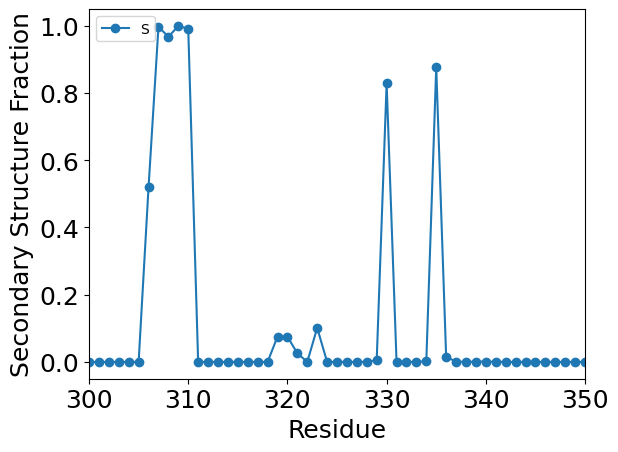

In [9]:
####HOMEWORK ######
#Use the full DSSP Definition and plot the population of another secondary structure type 
#https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html

dssp_full=md.compute_dssp(trj,simplified=False)
#array with 4000 frames and 252 amino acids 
#let's look at 3 helix vs 5 helix structures! Can modify the code from above to make a function to turn these structures into binary 


def dssp_convert_full(dssp):
    dsspS = np.copy(dssp)
    for i in range(len(dsspS)):
        for j in range(len(dsspS[i])):
            if dsspS[i][j] == 'S':  
                dsspS[i][j] = 1
            else:
                dsspS[i][j] = 0
    dsspS = dsspS.astype(int)
    TotalS = np.sum(dsspS, axis=1) 
    Sprop = np.sum(dsspS, axis=0).astype(float) / len(dsspS) 
    return Sprop
# have to use for loop by going row by row (each frame) then making the binary array going index by index for each residue for each frame
# leads to for loop embedded within a for loop 
Sprop=dssp_convert_full(dssp_full)
plt.plot(residue_num,Sprop,marker='o',label='S')
plt.legend(loc="upper left")
plt.xlabel('Residue', size=18)
plt.ylabel('Secondary Structure Fraction', size=18)
plt.tick_params(labelsize=18)
plt.xlim(300,350)

#np.where(Sprop>.90)
np.asarray(residue_num)[np.where(Sprop>.90)]

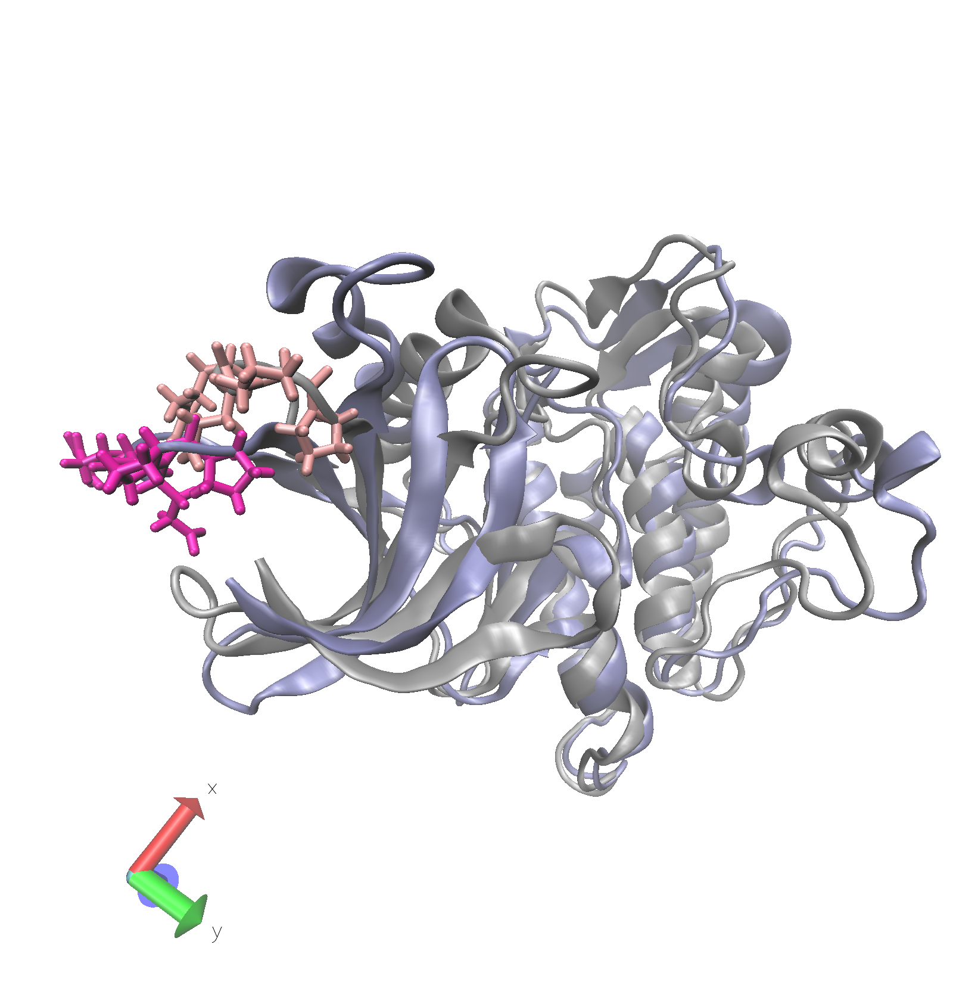

In [10]:
from PIL import Image
from IPython.display import display

image_path = outdir + "/Q1.png"

img = Image.open(image_path)
display(img)

The trajectory at frame 0 is shown in silver with residues 307-310 shown in light pink. At frame 2500, residues 307-310 are oriented differently in space, shown in the dark pink licorice representation and with the iceblue representation of the entire protein. These residues are always in a bend (as shown by the population graph above) but orient differently over time as the rest of the protein changes conformations/switches between rotamers and differnet energy basins.

***Challenge Problem #1***

**Write function/efficient loop to calculate all secondary structure populations from the dssp_full definitions 
and write out all residues numbers with > 90% of each secondary structure type**

Structure: H [281 282 283 324 325 326 327 337 338 339 340 341 342 343 344 345 346 347
 348 349 350 351 352 353 354 355 410 411 422 423 424 425 426 427 428 429
 430 431 432 433 466 467 468 469 470 471 472 473 474 475 486 487 488 489]
Structure: E [246 247 248 249 255 256 257 258 259 260 261 266 267 268 269 270 271 272
 301 302 303 304 313 314 315 369 370 371 377 378 379 392 393 394 415 416
 417]
Structure: I []
Structure: G []
Structure: B [298]
Structure: T [262 263 264 265 275 276 277 296 297 319 320 332 333 334 358 418 419 434
 435]
Structure: S [307 308 309 310 390 391 414 436 439 440 478 479 483]
Structure:   [242 274 279 293 294 299 300 311 317 318 331 336 361 363 364 380 381 382
 385 388 402 407 437 438 444 457 459 460 461 465 477 484 485 493]


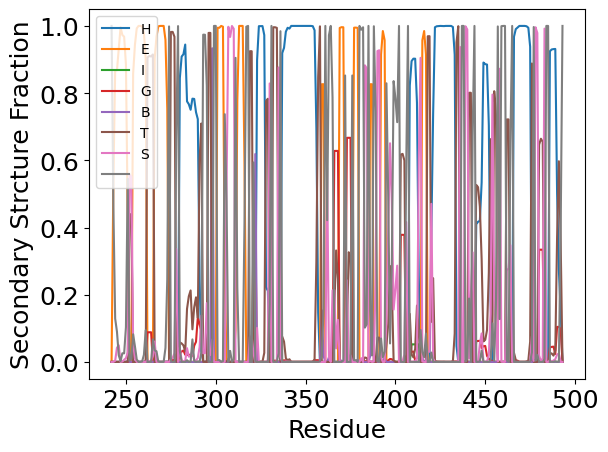

In [11]:
#### Challenge Problem Write a Function to Compute the Population of Any Secondary Structure Type
#### Write a loop to plot all populations
#### Write code to output the residue numbers of every residue with > 90% each SS type

def secondary_structure_populations(dssp,type):
    dsspA = np.copy(dssp)
    for i in range(len(dsspA)):
        for j in range(len(dsspA[i])):
            if dsspA[i][j] == type:  
                dsspA[i][j] = 1
            else:
                dsspA[i][j] = 0
    dsspA = dsspA.astype(int)
    TotalA = np.sum(dsspA, axis=1) 
    Aprop = np.sum(dsspA, axis=0).astype(float) / len(dsspA) 
    return Aprop

structures = ['H','E','I','G','B','T','S',' ']

for i in structures:
  Aprop=secondary_structure_populations(dssp_full,i)
  plt.plot(residue_num,Aprop,label=i)
  print("Structure:",i,np.asarray(residue_num)[np.where(Aprop>.90)])

plt.legend(loc="upper left")
plt.xlabel('Residue', size=18)
plt.ylabel('Secondary Strcture Fraction', size=18)
plt.tick_params(labelsize=18)

***HOMEWORK Problem 2***

**Identify a residue that has a substantial population (>10%) of a second secondary structure assignment 
(for example something that is 50% helix/ 50% coil or 80% helix/ 20% coil) and make representative snapshots to illustrate the 2 conformations.  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation**

In [12]:
#Find all the frames where a given residue is H or E
residue_number=412
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])

helix_frames=np.where(dssp[:,array_index]=='H')
coil_frames=np.where(dssp[:,array_index]=='C')

#4000=number of frames 
print("Residue", residue_num[array_index])
print("Residue name", resname[array_index])
print("helix_frames:", helix_frames[0].shape[0]/4000) 
print("coil_frames:", coil_frames[0].shape[0]/4000)

#using helix_frames[0] ensures we're working with just the array containing all the helical frames
#by using .shape[0], we find the number of frames in this array and then divide by 4000 for total num of frames in the simulation to get %

412
Residue 412
Residue name ALA
helix_frames: 0.823
coil_frames: 0.177


ALA412 is a helix 82.3% of the time and a coil 17.7% of the time. We can visualize both conformations in VMD once we find corresponding frames. 

In [13]:
#Let's find the specific frames where the simulation shows a helix or a coil
print("Helix frames:", helix_frames[0])
print("Coil frames:", coil_frames[0])

Helix frames: [   0    3    4 ... 3996 3997 3999]
Coil frames: [   1    2    5   15   18   19   22   23   28   29   31   32   44   48
   51   74   76   77   96  104  119  122  123  129  141  154  158  168
  169  174  176  219  225  226  229  257  268  277  282  284  287  294
  302  318  326  348  359  372  381  442  449  457  458  463  470  475
  478  485  486  489  497  502  514  517  518  521  524  525  529  531
  539  541  547  548  551  552  559  561  567  568  571  575  588  589
  595  621  629  638  643  647  653  665  667  672  678  707  714  732
  735  744  745  748  749  750  763  764  765  766  770  772  777  783
  797  798  804  806  808  809  810  812  817  824  825  832  833  850
  852  853  854  855  863  866  872  886  900  906  908  917  919  920
  921  923  932  933  934  936  955  960  961  980  982  983  998 1001
 1018 1022 1024 1025 1029 1040 1042 1044 1045 1047 1048 1053 1057 1059
 1062 1065 1066 1074 1078 1082 1085 1091 1092 1093 1095 1096 1098 1099
 1105 1111 111

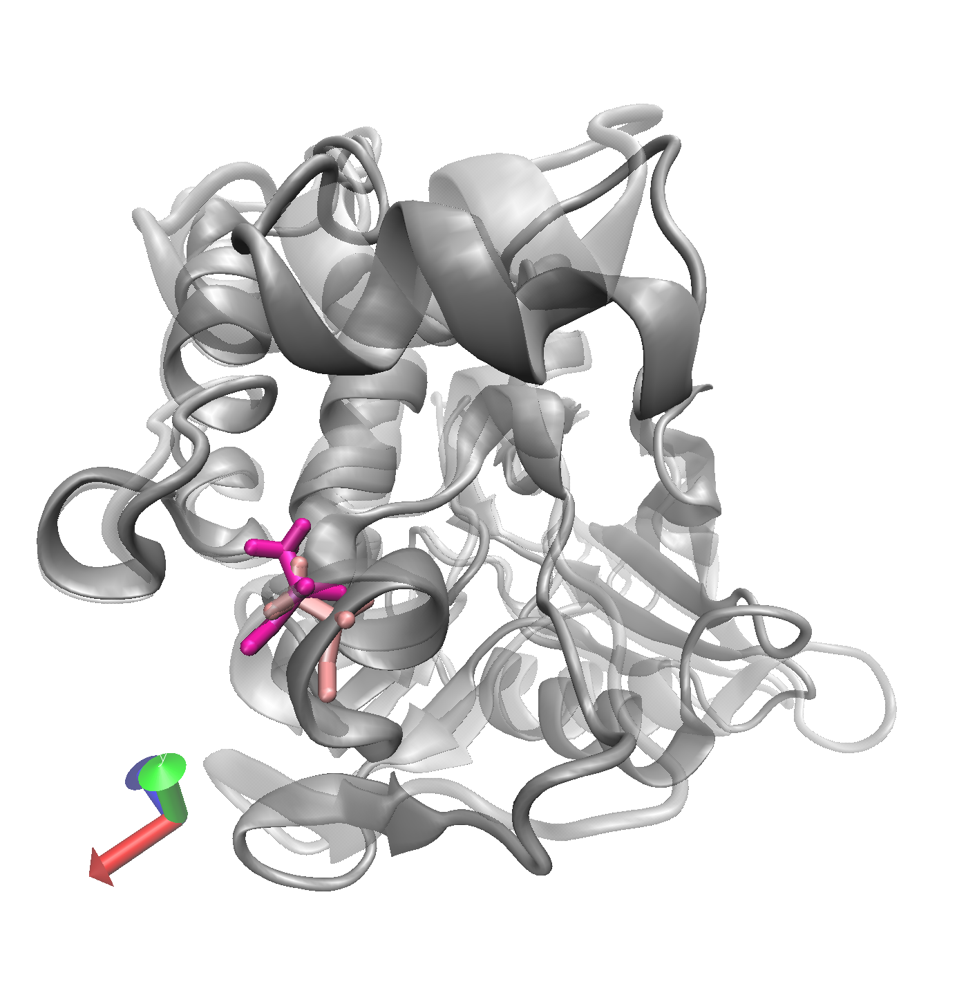

In [14]:
#Importing the images
image_path = outdir + "/Q2.png" 
img = Image.open(image_path)
display(img)

The protein is shown in silver (opaque is the helical frame 0 and transparent is the coil state in frame 23). ALA412 is shown in pink (light pink is frame 0 and magenta is frame 23). 

To better understand some of the interactions that cause the helical state to be more populated, let's look at each frame individually below. 

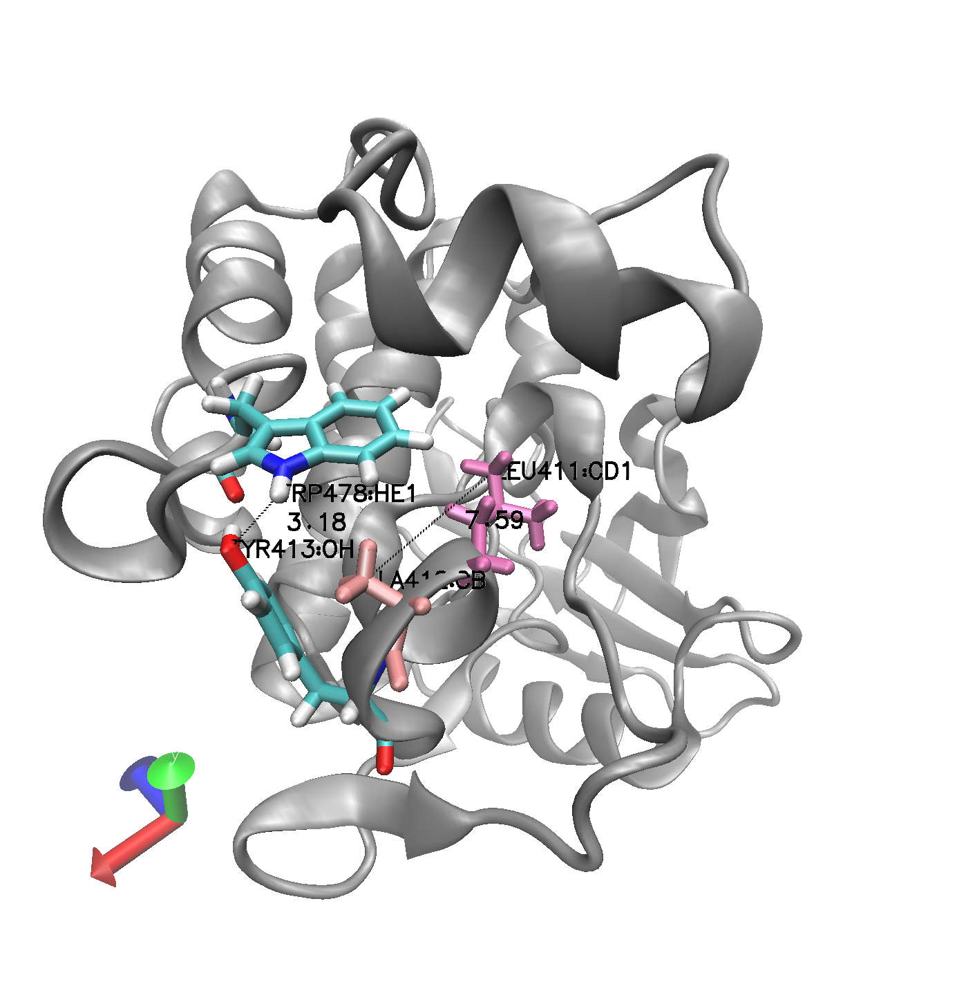

In [15]:
#frame0
image_path = outdir + "/Q2_frame0.png"
img = Image.open(image_path)
display(img)

This image is showing frame 0. Light pink ALA412 can interact with LEU411 shown in mauve as both are hydrophobic and can pack together. However, in the helix state, these residues are far apart (distance of 7.59 A). Instead, the hydrogen bonding interactions stabilize the helix, as the majority of the residues that surround ALA412 are polar and capable of H bonding (SER, LEU, ALA412, TYR, ASN, LYS) with other nearby structures. In this snapshot, we can see an H bond between TYR413 and TRP478 at a distance of 3.18A. 

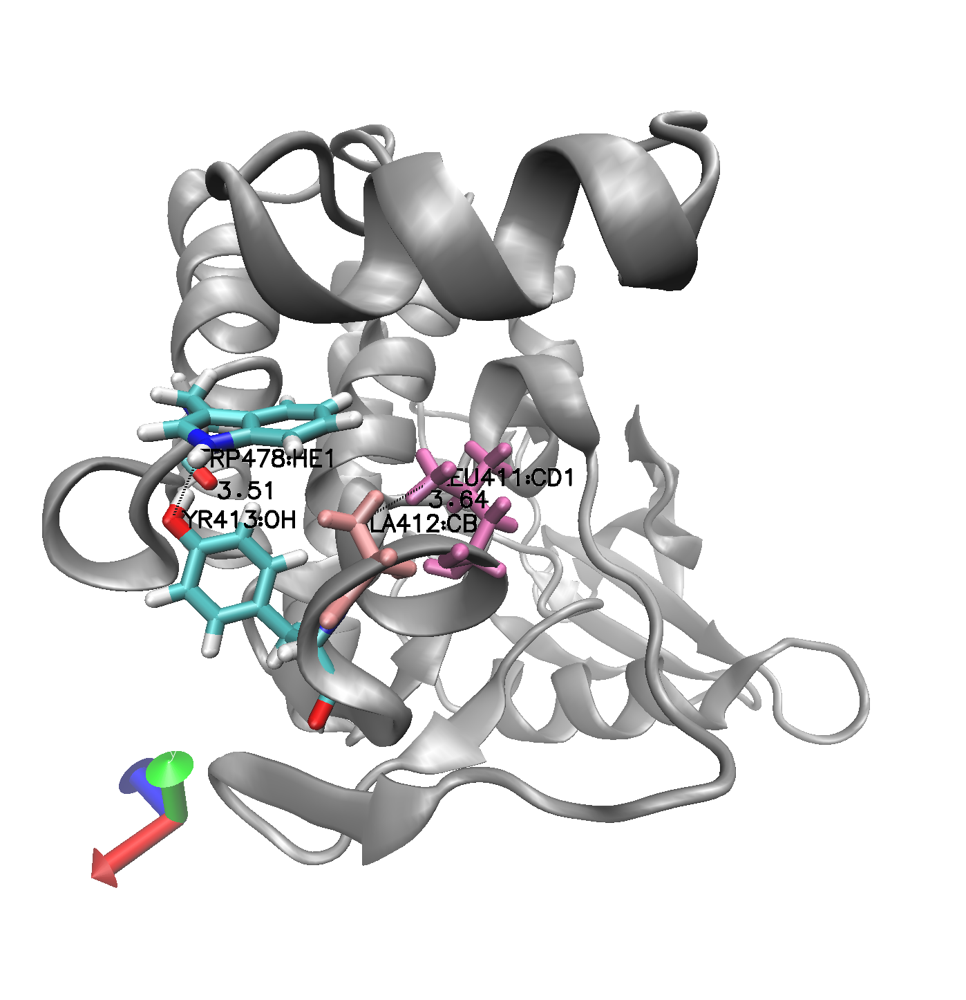

In [16]:
#frame 23
image_path = outdir + "/Q2_frame23.png"
img = Image.open(image_path)
display(img)

This image is showing frame 23. Using the same color scheme as the image above, the pink hydrophobic residues can now pack much closer together (3.64A), while the H bond between TRP and TYR is slightly too long to form a tight intearction (3.51A). While the hydrophobic interactions stabilize the coil, the helical state is likely more populated given the heavy presence of polar residues that can H bond. The increased number of polar contacts means more stability and is likely the reason for the 82.3% helix and 17.7% coil split in populations. 

**Code to be used for future problems:**

In [17]:
indices_phi, phis = md.compute_phi(trj)
indices_psi, psis = md.compute_psi(trj)
indices_chi1, chi1s = md.compute_chi1(trj)
indices_chi2, chi2s = md.compute_chi2(trj)

In [18]:
print(np.shape(phis[:,0]))
print(np.shape(indices_phi)) 

(4000,)
(251, 4)


In [19]:
print(np.shape(chi1s[:,0]))
print(np.shape(indices_chi1)) 
print(len(indices_chi1))

(4000,)
(218, 4)
218


In [20]:
phi_dict={}
dihedral_dict = { 'phi': { },
          'psi': { },
          'chi1': { },
          'chi2': { }}

for i in range(0,len(indices_phi)):
  indices=indices_phi[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['phi'][resnum]=phis[:,i]

for i in range(0,len(indices_psi)):
  indices=indices_psi[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['psi'][resnum]=psis[:,i]

for i in range(0,len(indices_chi1)):
  indices=indices_chi1[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['chi1'][resnum]=chi1s[:,i]

for i in range(0,len(indices_chi2)):
  indices=indices_chi2[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['chi2'][resnum]=chi2s[:,i]

In [21]:
#Heres a function to plot a phi/psi ramachandran plot:

def plot_phipsi(res, marker_phi=None, marker_psi=None):
 plt.hist2d(dihedral_dict['phi'][res],dihedral_dict['psi'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
 plt.xlabel('$\phi$', size=18)
 plt.ylabel('$\psi$', size=18)
 plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.tick_params(labelsize=18)
 if marker_phi is not None and marker_psi is not None:
    for idx, i in enumerate(marker_phi):
        plt.plot(i, marker_psi[idx], color='black', marker="o", markersize=15, linewidth="1", label="configuration pictured")
    plt.legend()
 plt.show() 

 return

def plot_chi1(res, marker=None):
    if res in dihedral_dict['chi1']:
        plt.hist(dihedral_dict['chi1'][res],bins=36,range=[-3.14,3.14])        
        plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
        plt.xlabel('$\chi_1$', size=18)
        plt.ylabel('counts', size=18)
        plt.tick_params(labelsize=18)
    if marker != None:
        for i in marker:
            plt.plot(i, 10, color='r', marker="x", markersize="20", label=str(i) + " rotamer")
        plt.legend()
    plt.show()
    plt.clf()  

def plot_chi2(res):
    if res in dihedral_dict['chi2']:
     plt.hist2d(dihedral_dict['chi1'][res],dihedral_dict['chi2'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
     plt.xlabel('$\chi_1$', size=18)
     plt.ylabel('$\chi_2$', size=18)
     plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.tick_params(labelsize=18)
     plt.show()

    




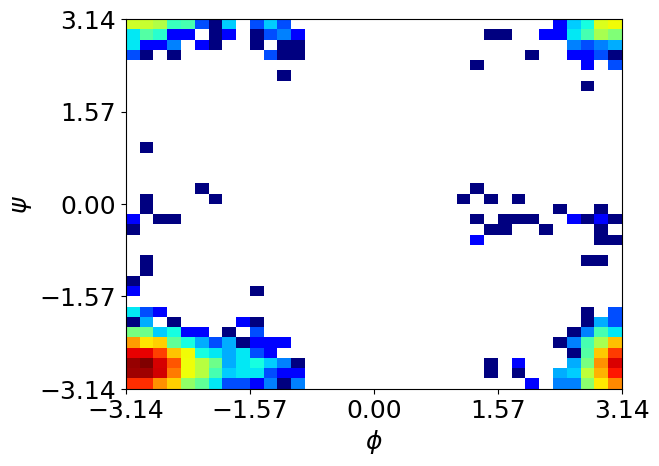

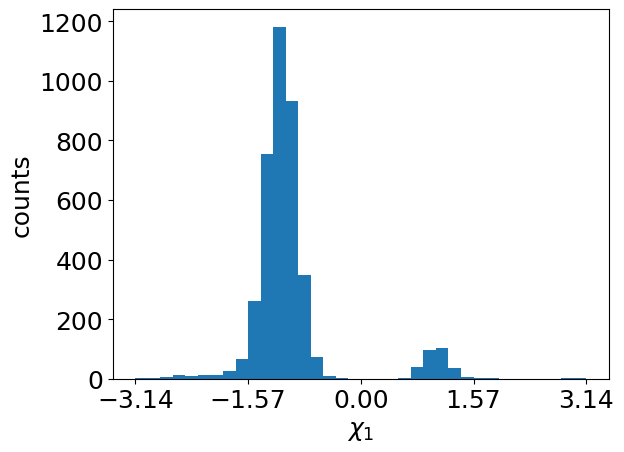

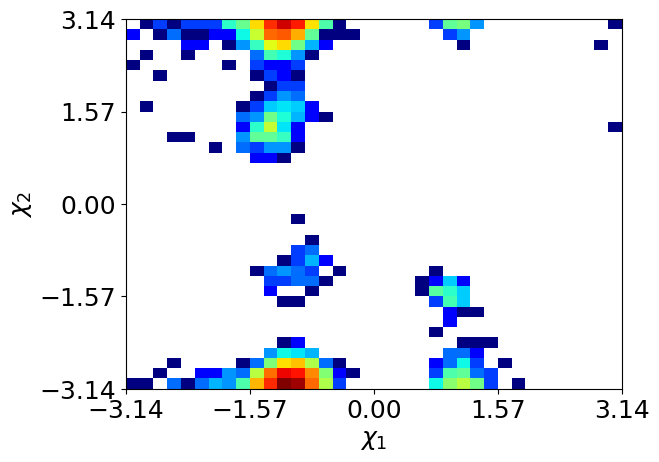

In [22]:
plot_phipsi(251)
plt.clf()
plot_chi1(308)
plot_chi2(308)

#glycine and pro weird plots

Residue 256


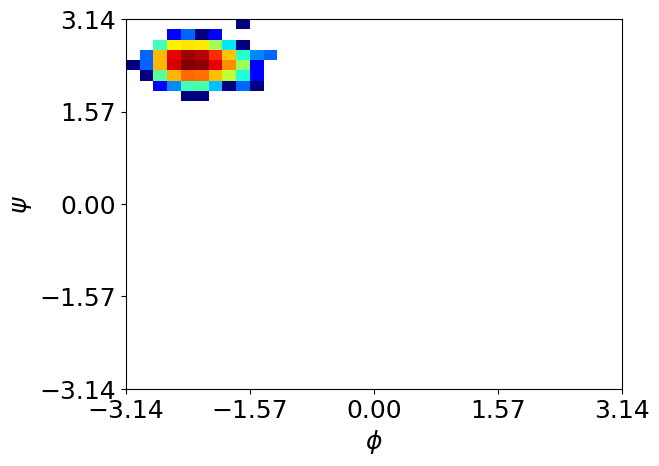

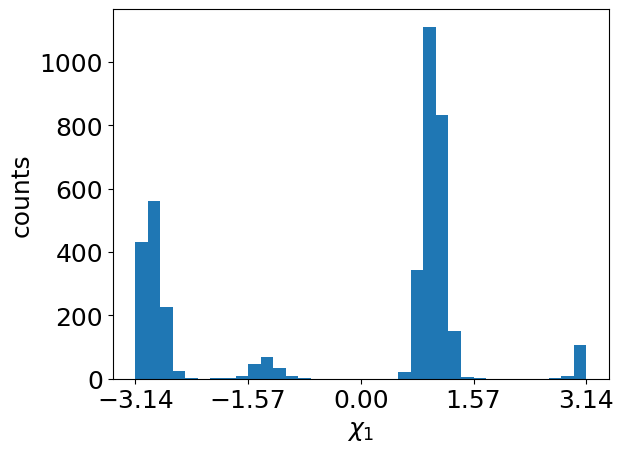

Residue 260


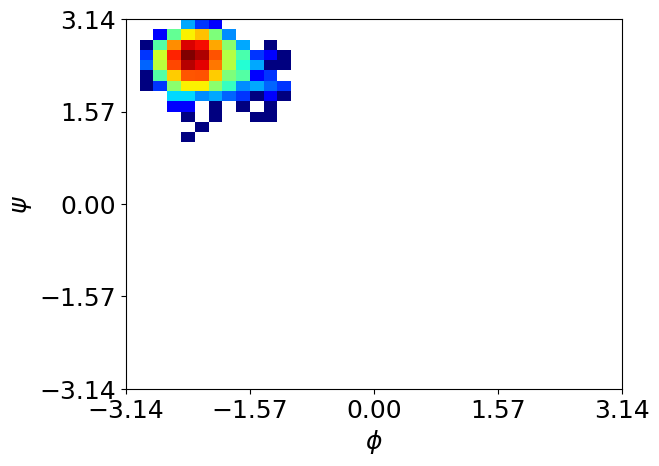

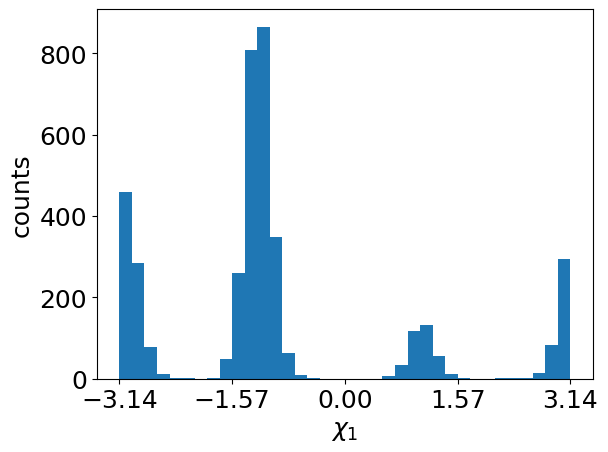

Residue 268


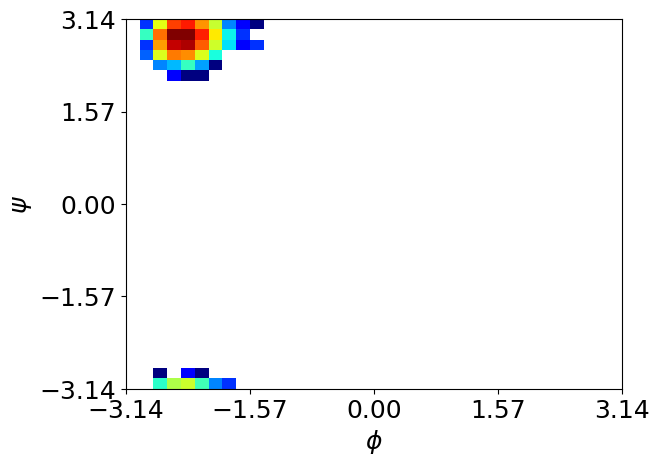

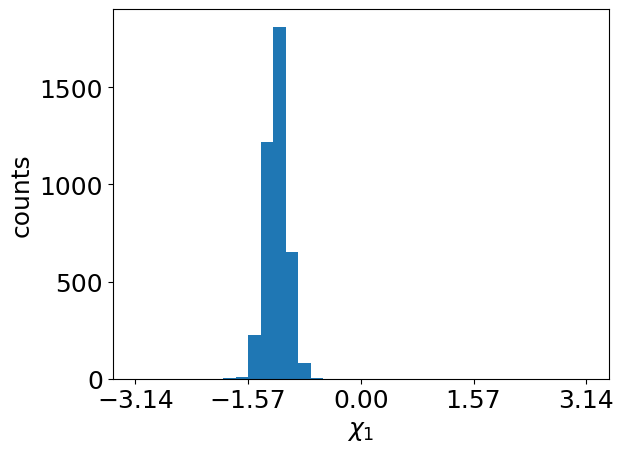

Residue 270


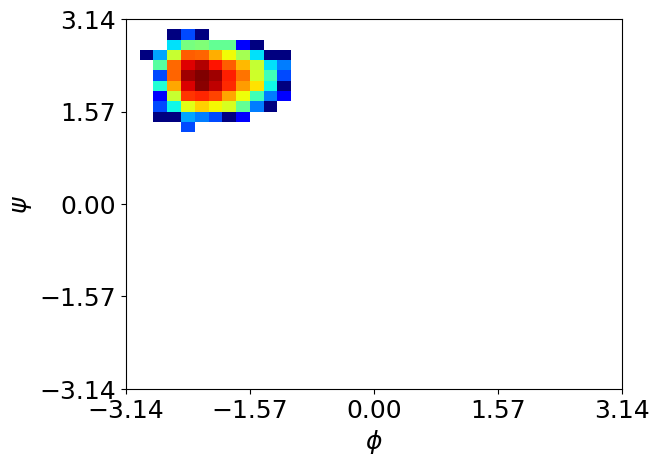

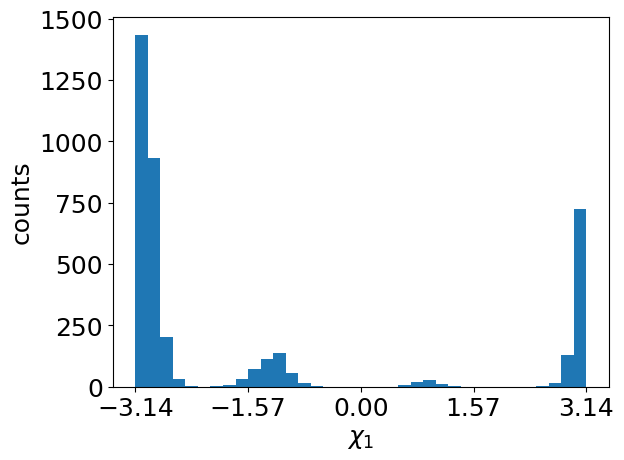

Residue 280


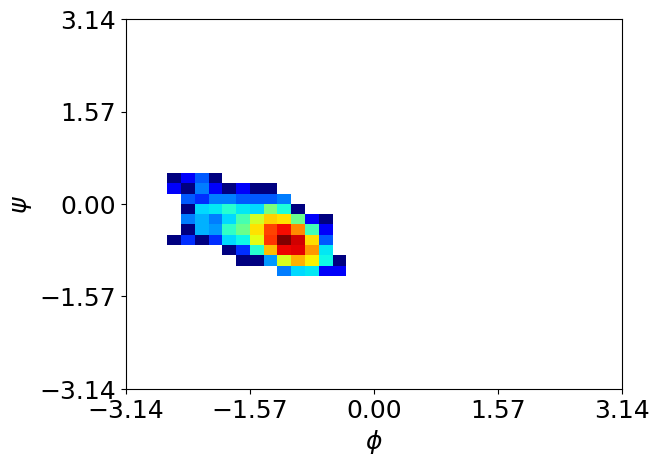

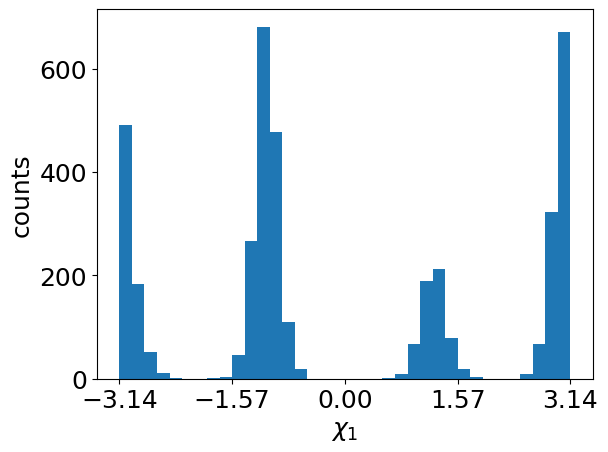

Residue 289


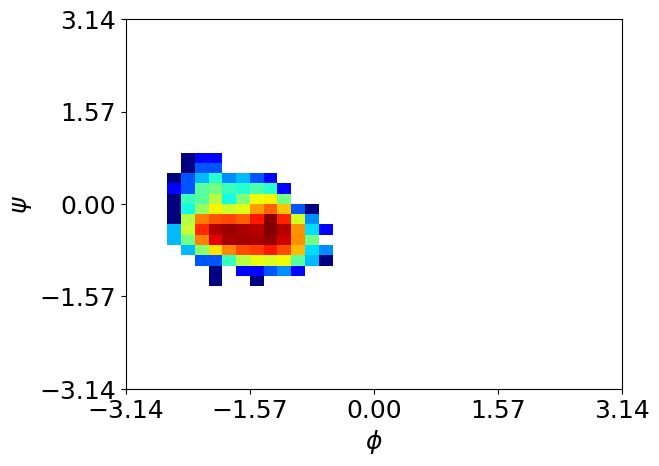

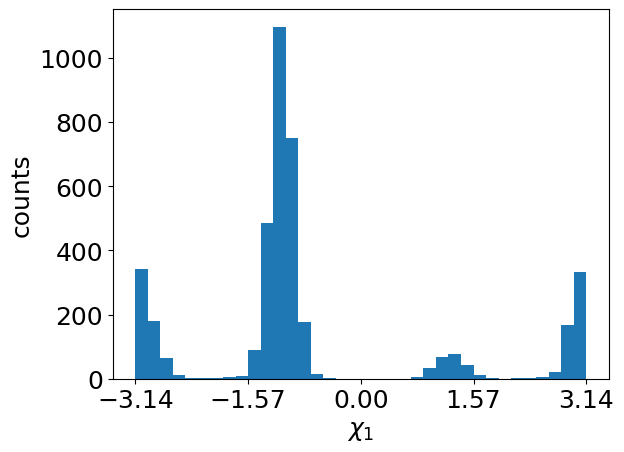

Residue 299


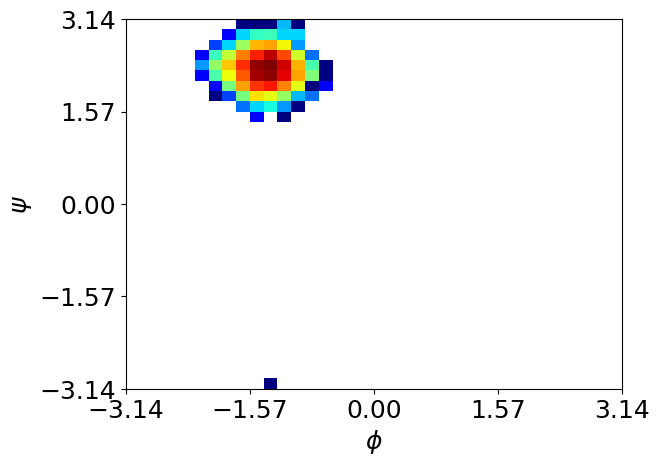

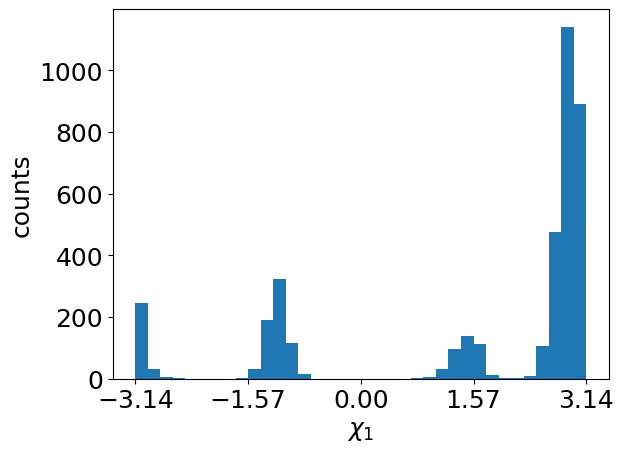

Residue 304


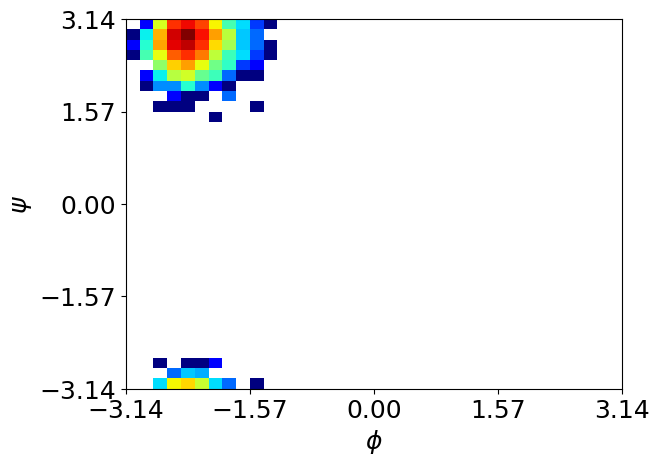

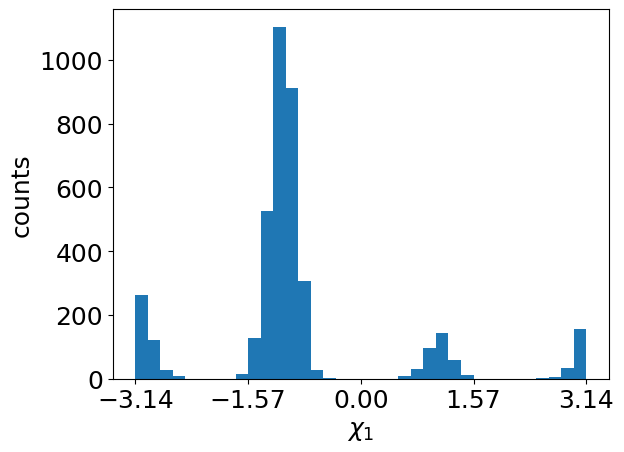

Residue 335


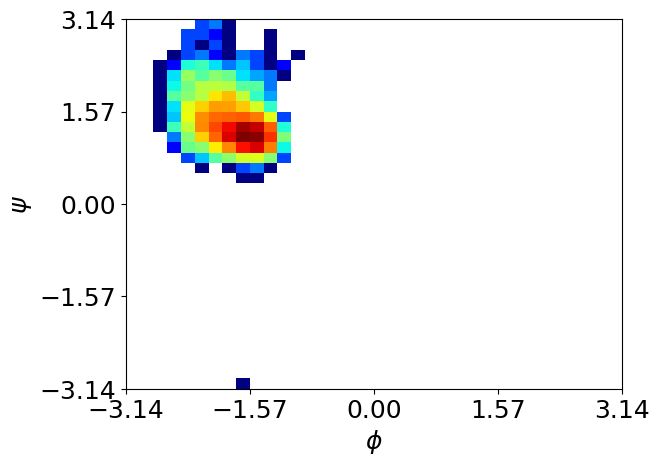

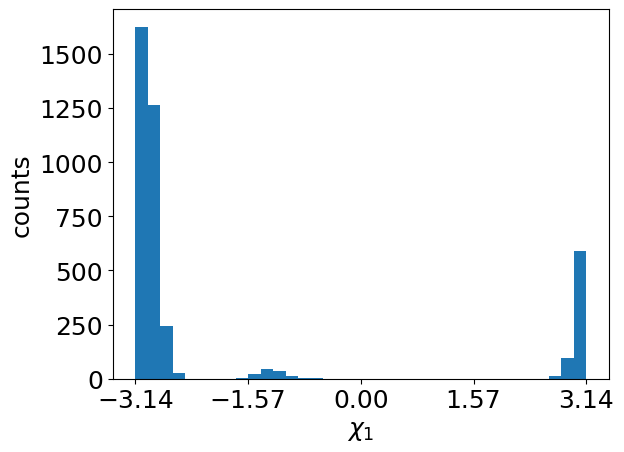

Residue 338


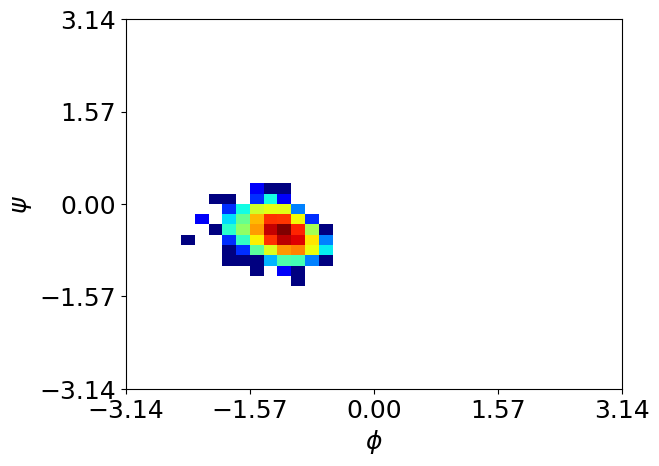

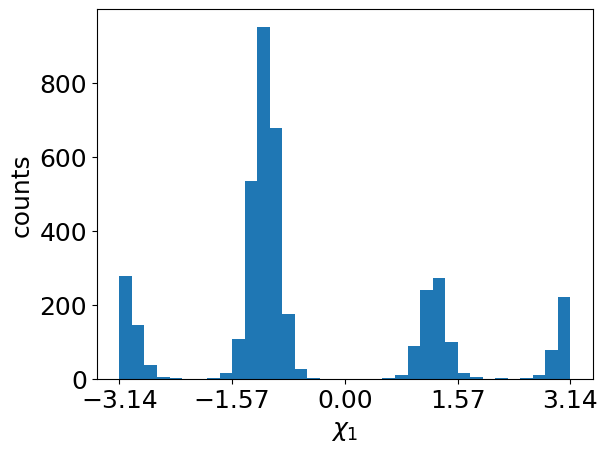

Residue 339


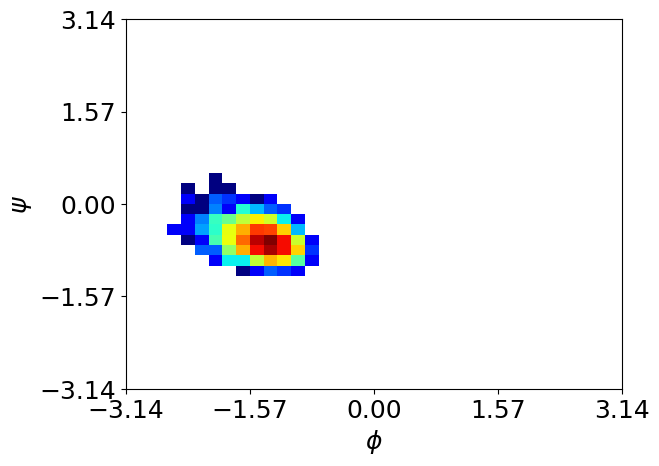

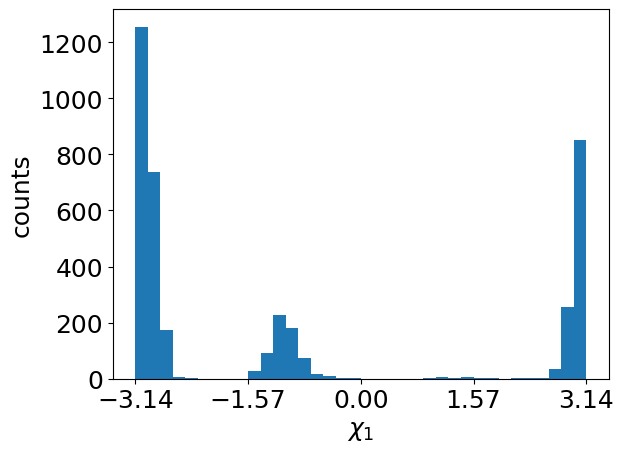

Residue 371


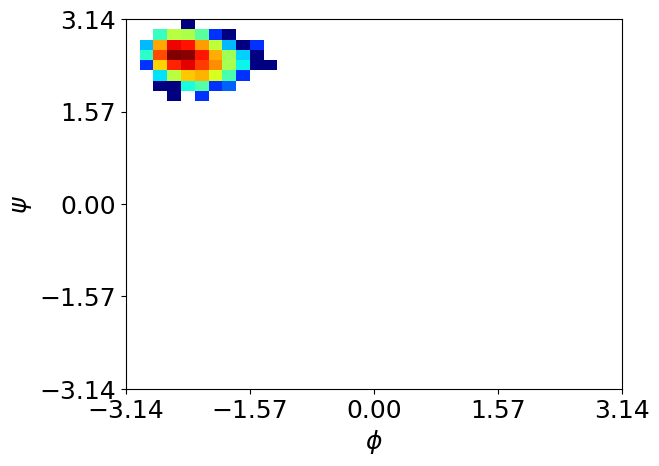

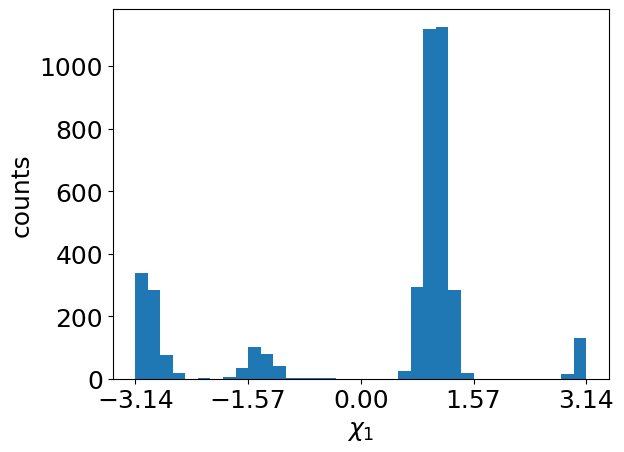

Residue 377


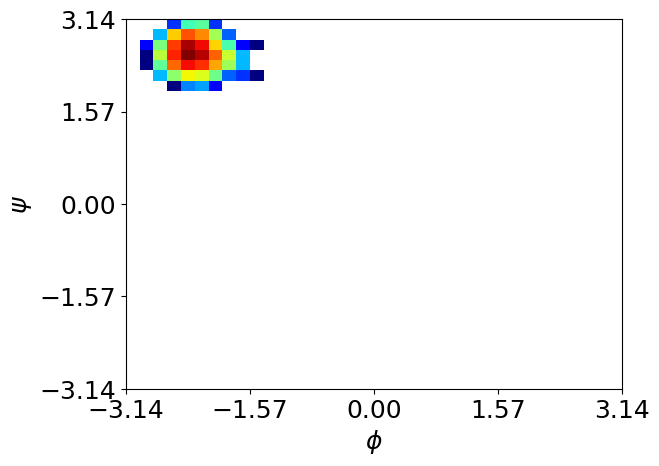

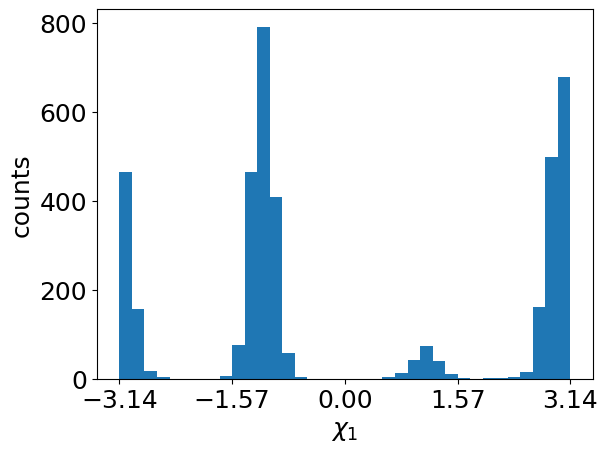

Residue 379


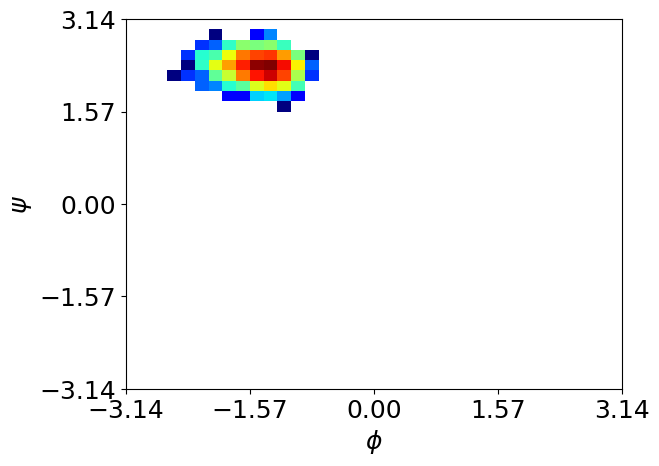

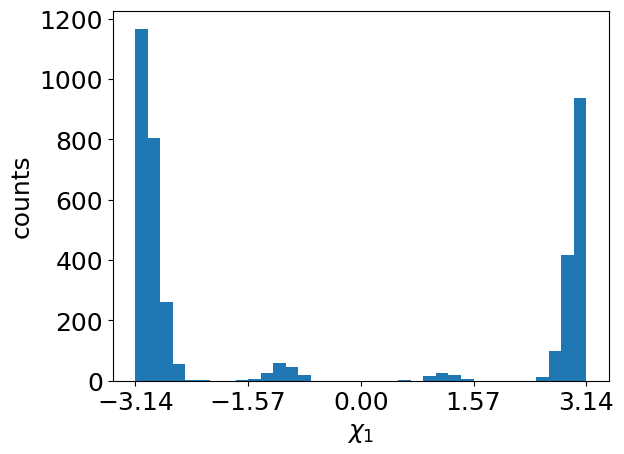

Residue 422


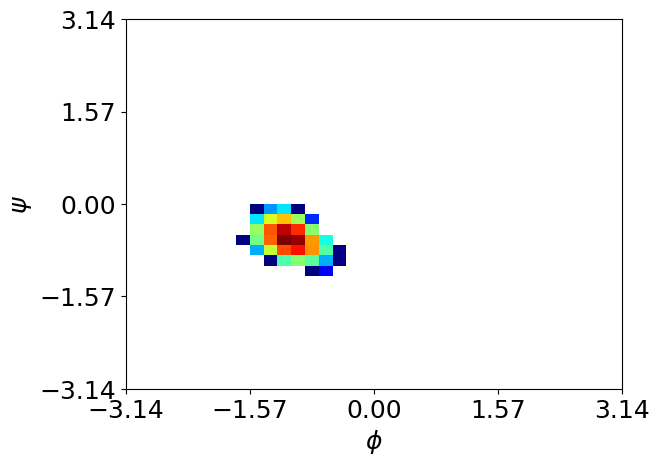

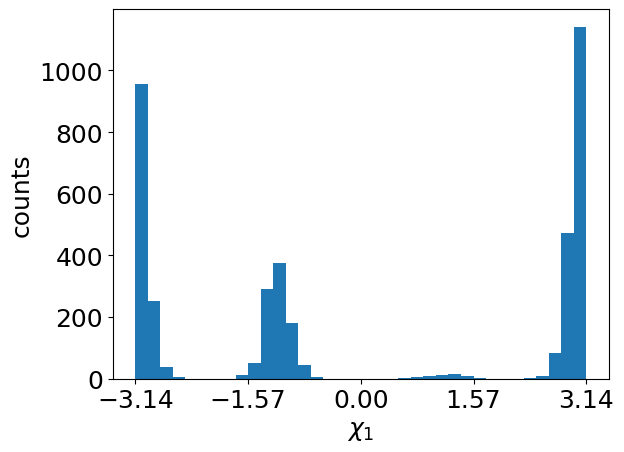

Residue 427


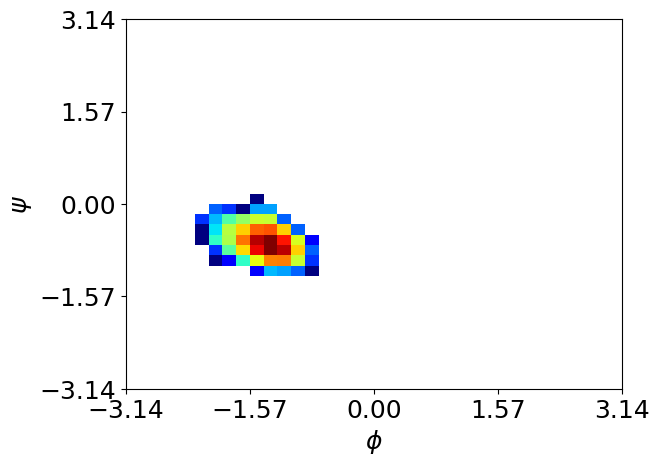

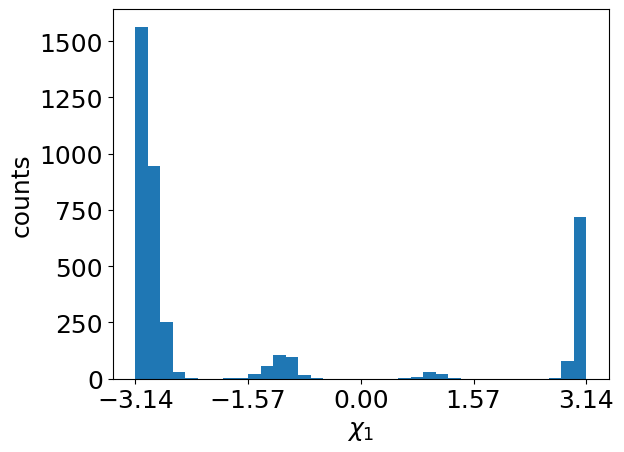

Residue 448


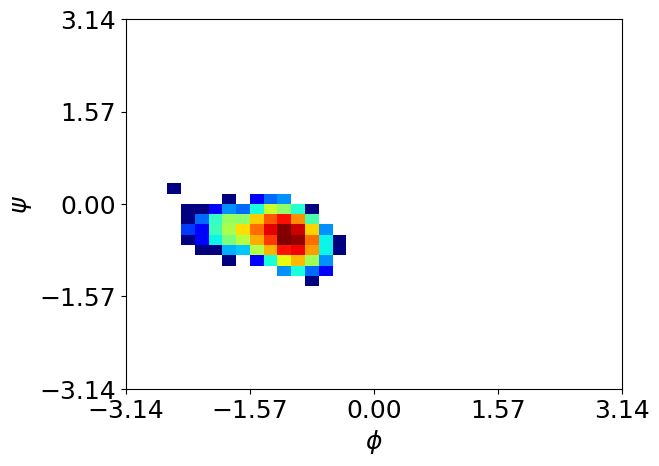

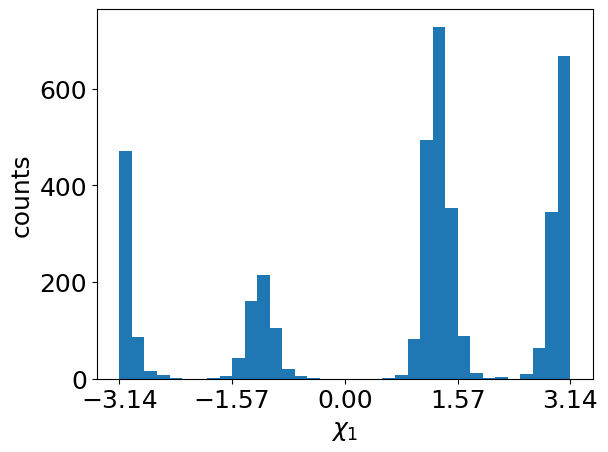

Residue 468


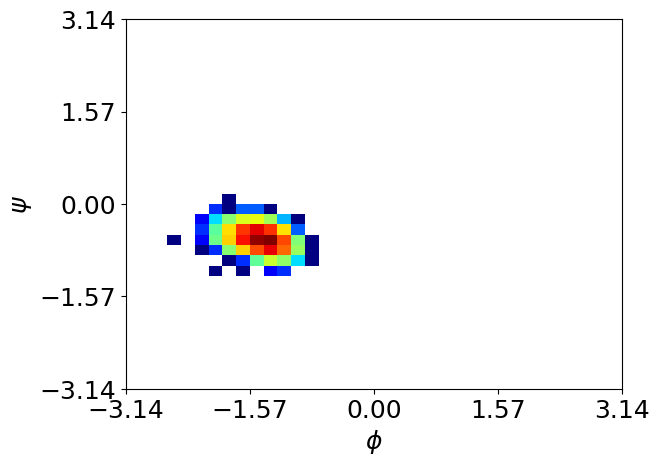

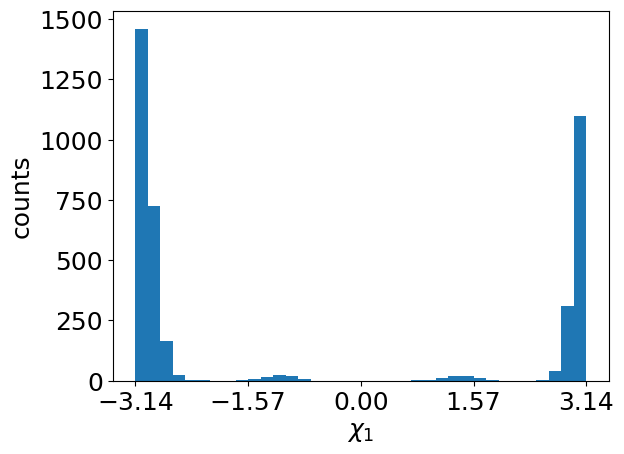

<Figure size 640x480 with 0 Axes>

In [23]:
#Lets Visualize Some Rotamers
#Lets Find all the VAL residues and plot thier X1 values
CA_sel=top.select('name CA')
resnames=[]
resnums=[]
for i in CA_sel:
 resnum=top.atom(i).residue.resSeq
 resnums.append(resnum)
 resname=top.atom(i).residue.name
 resnames.append(resname)

resnums=np.asarray(resnums)
resnames=np.asarray(resnames)
VAL_indices=np.where(resnames=='VAL')
Val_resnums=resnums[VAL_indices]
Val_resnums

for i in Val_resnums:
    print("Residue",i)
    plot_phipsi(i)
    plt.clf()
    plot_chi1(i)
    plt.clf()

Residue 256


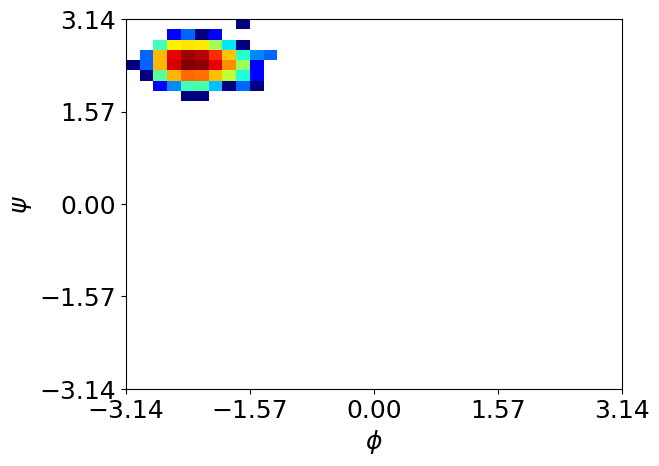

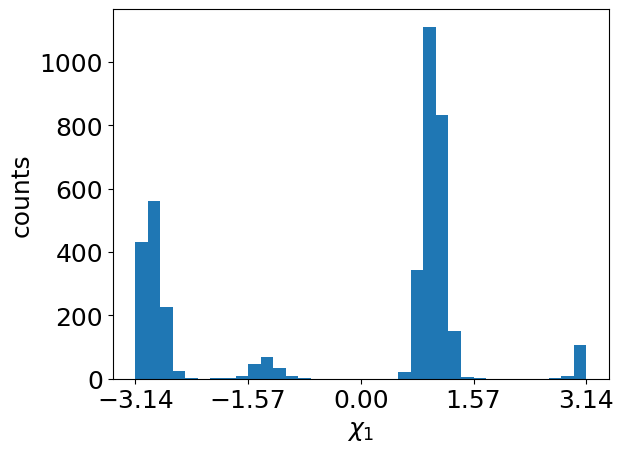

Residue 260


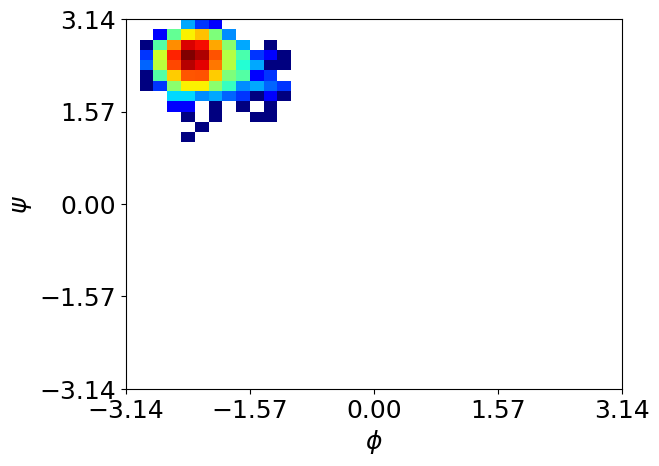

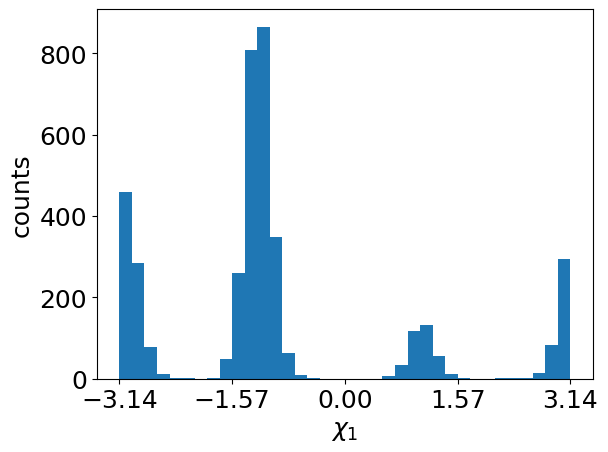

Residue 268


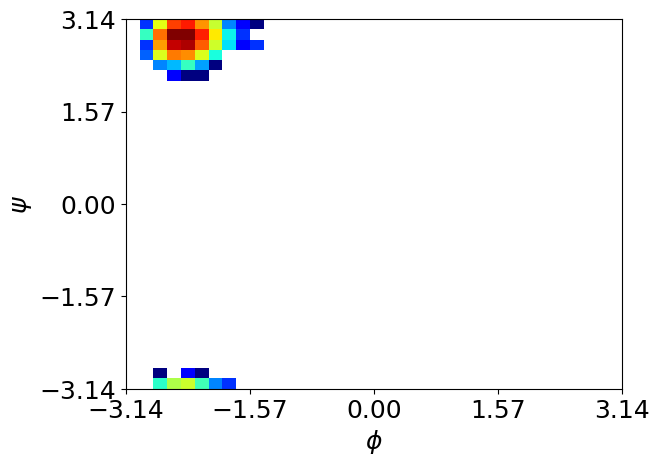

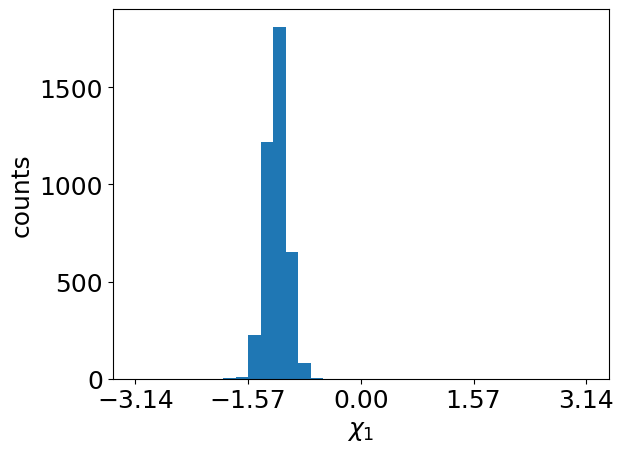

Residue 270


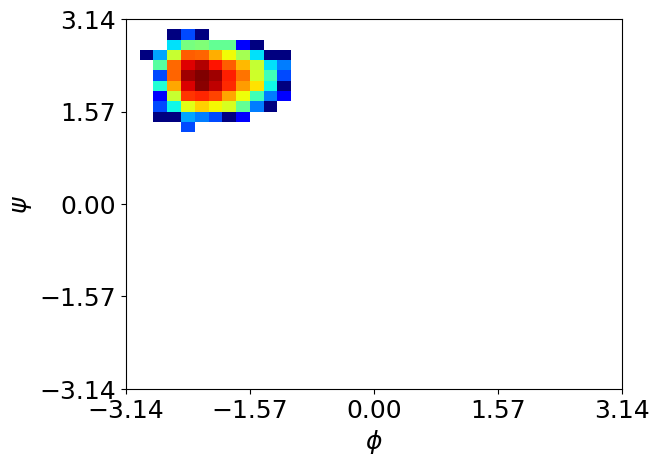

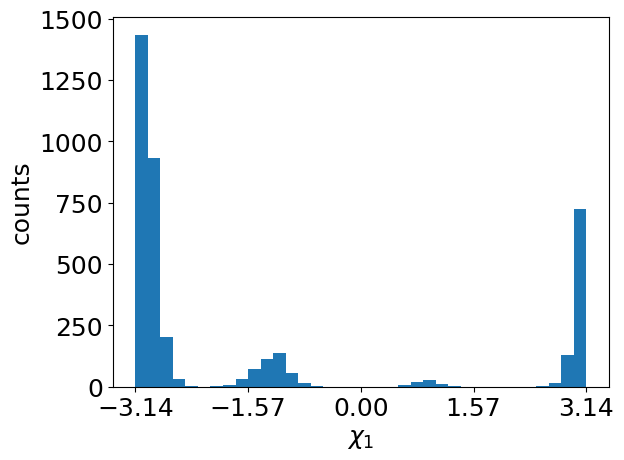

Residue 280


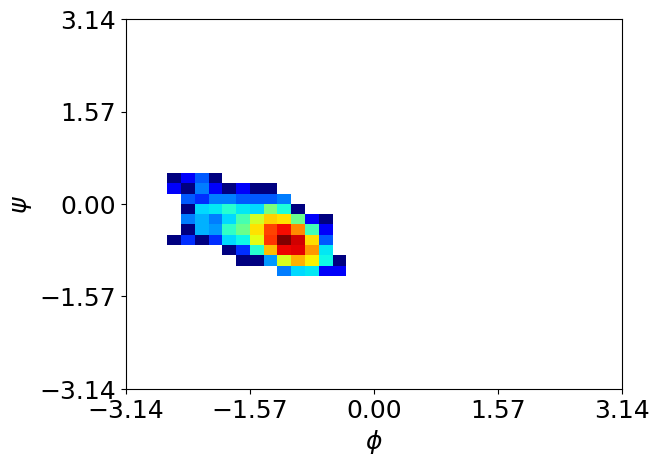

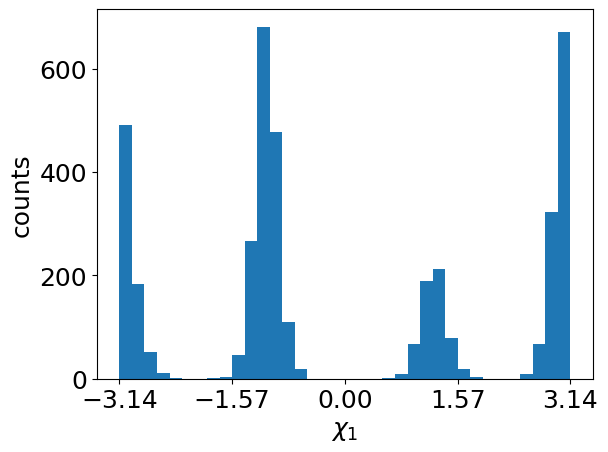

Residue 289


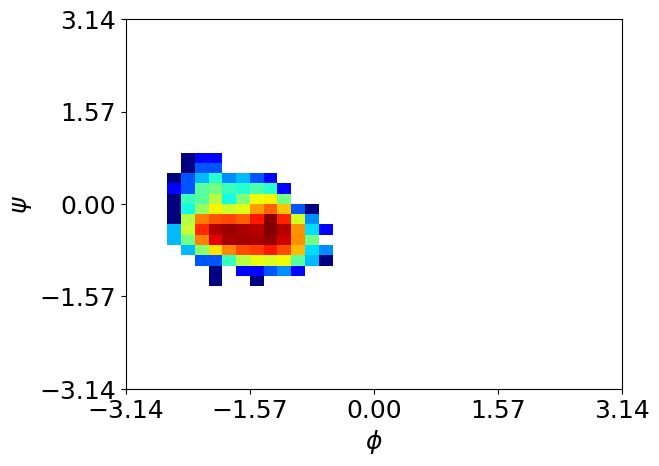

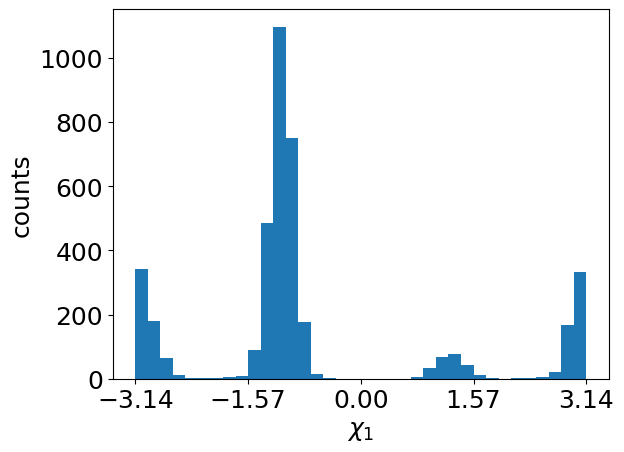

Residue 299


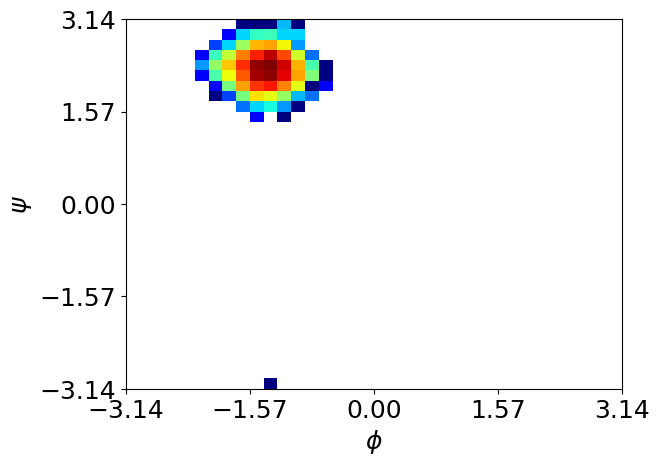

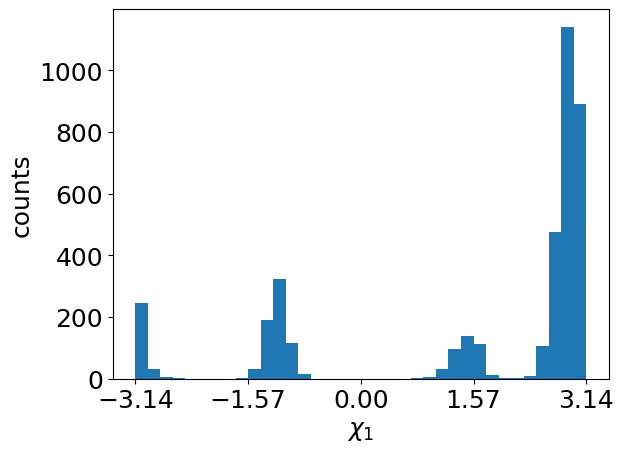

Residue 304


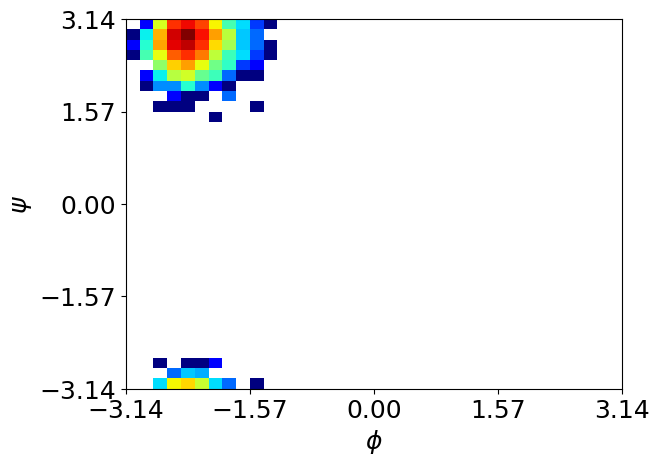

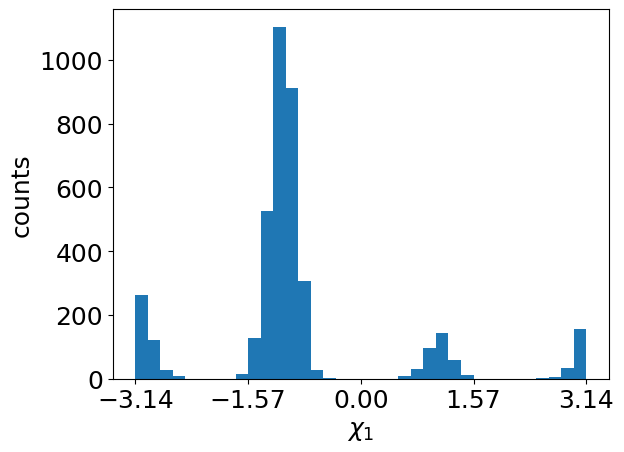

Residue 335


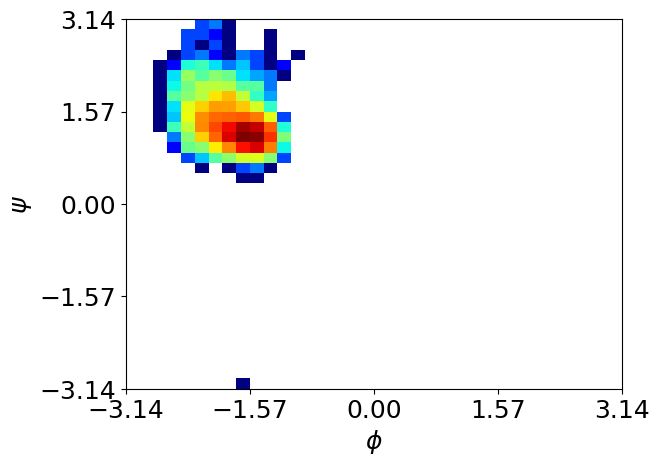

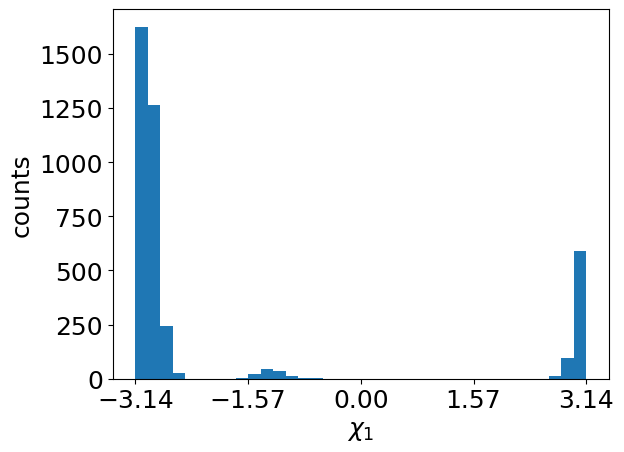

Residue 338


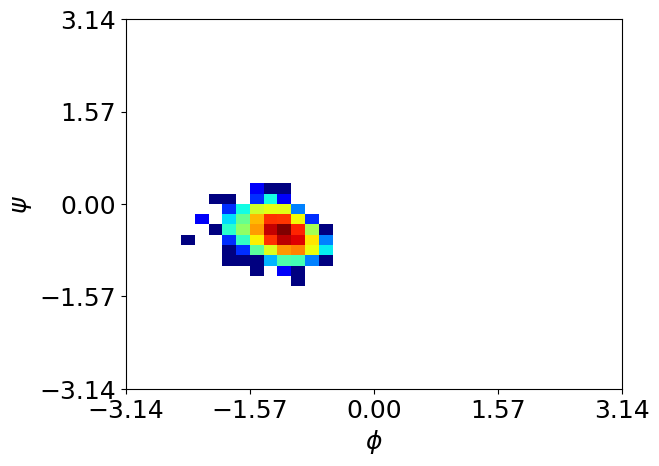

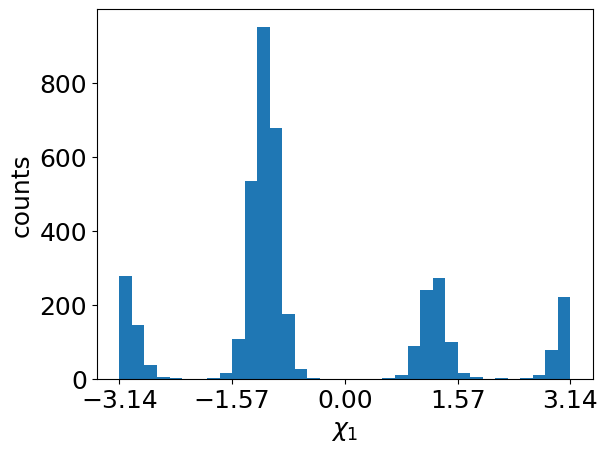

Residue 339


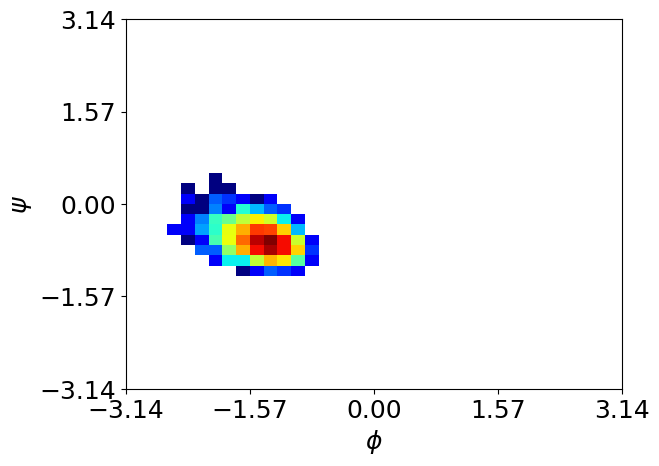

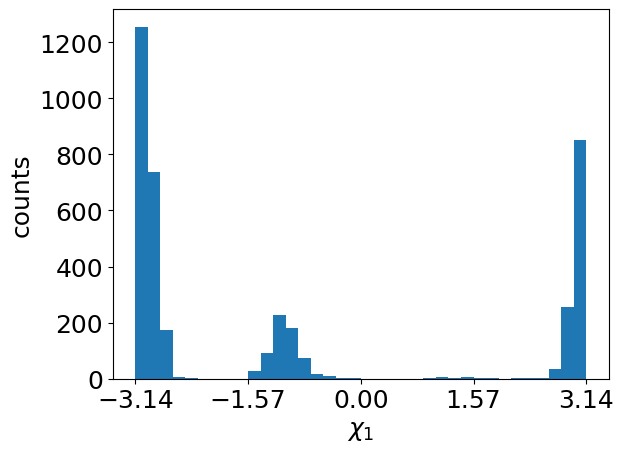

Residue 371


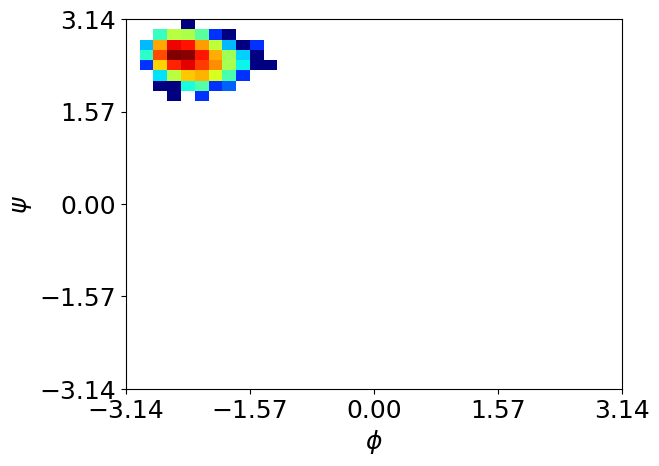

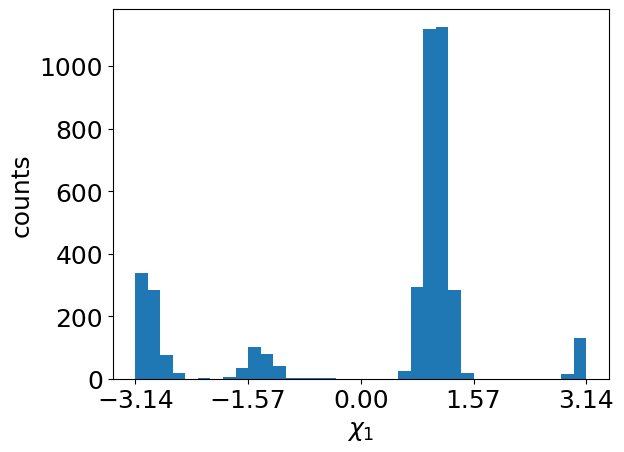

Residue 377


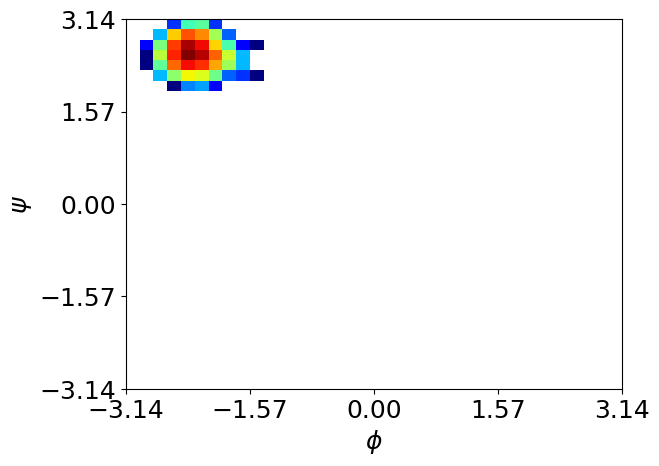

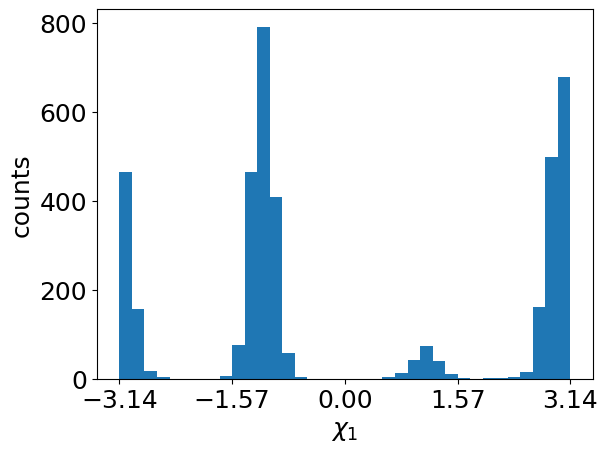

Residue 379


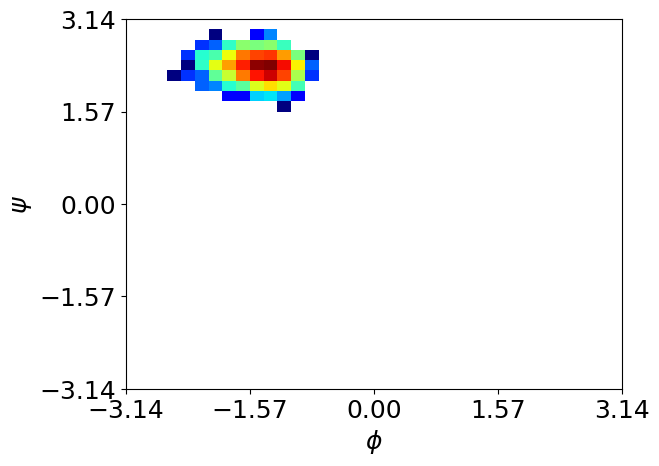

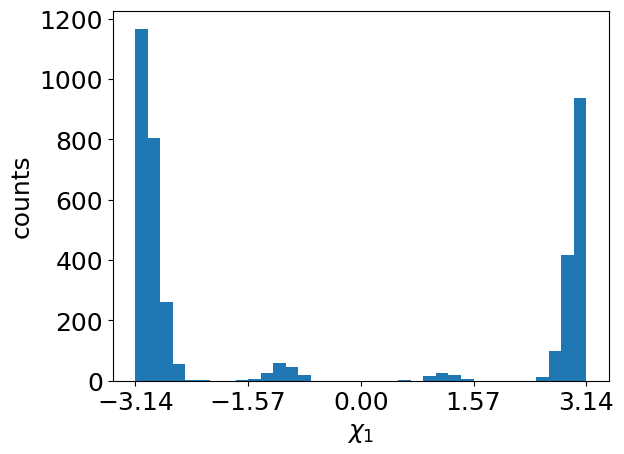

Residue 422


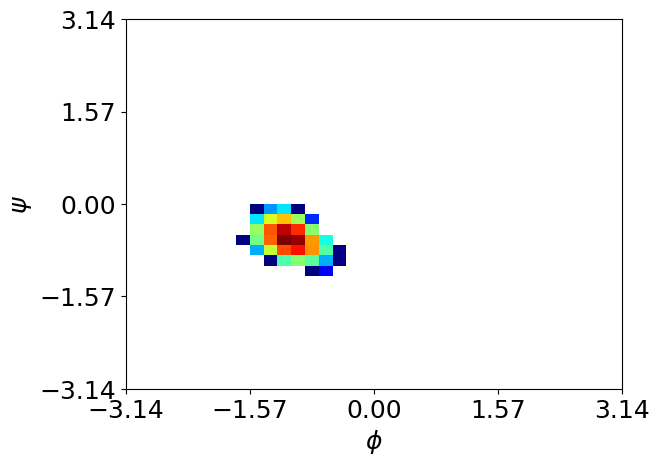

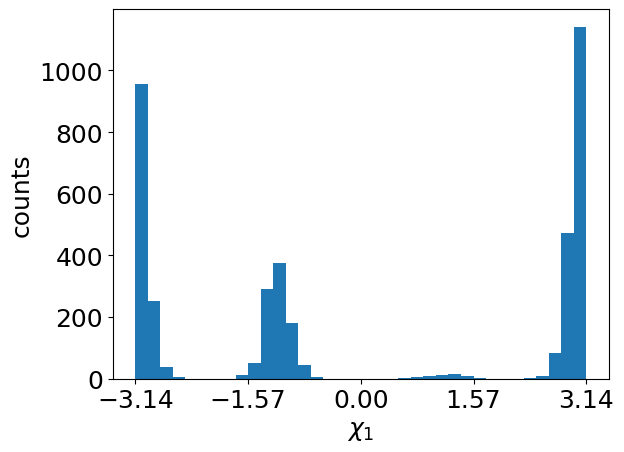

Residue 427


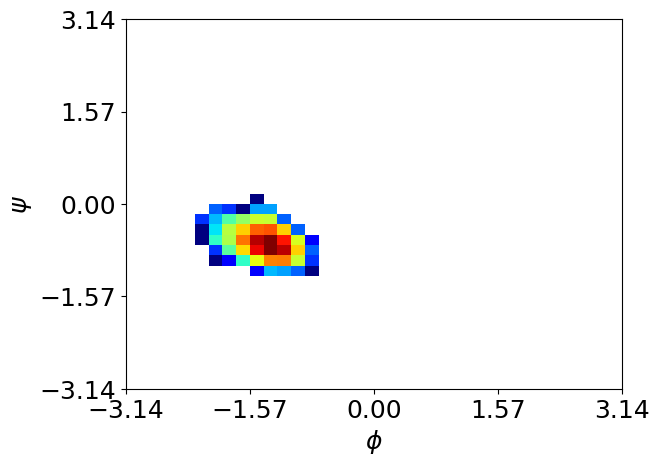

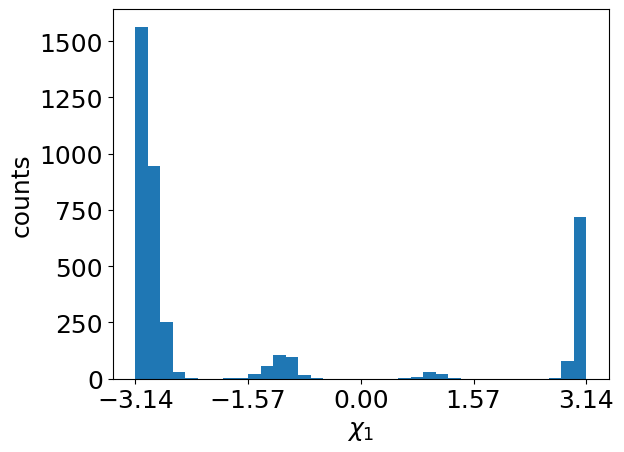

Residue 448


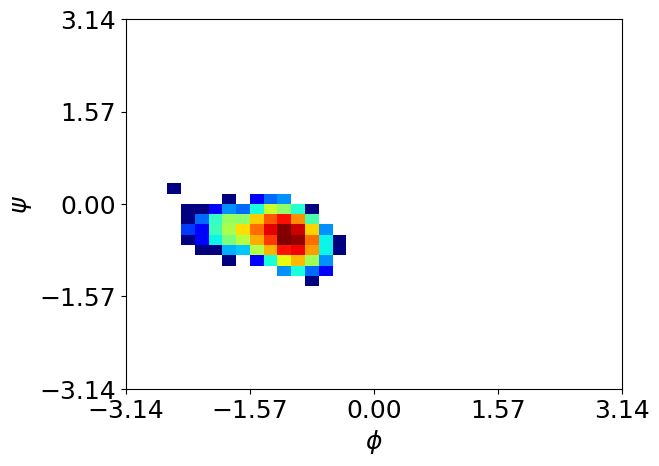

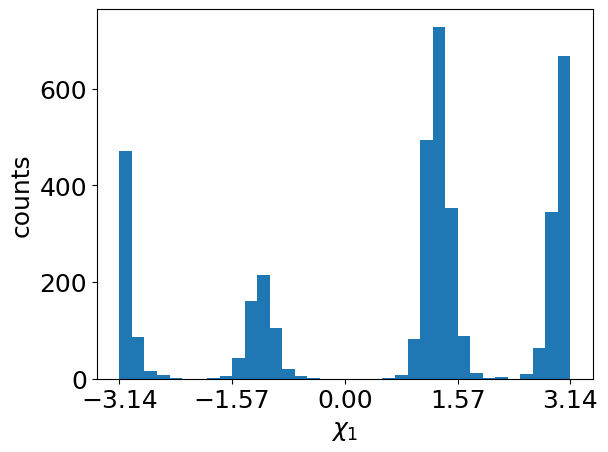

Residue 468


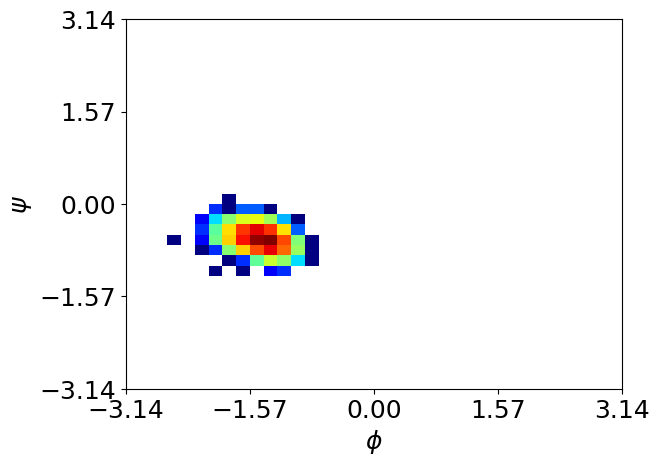

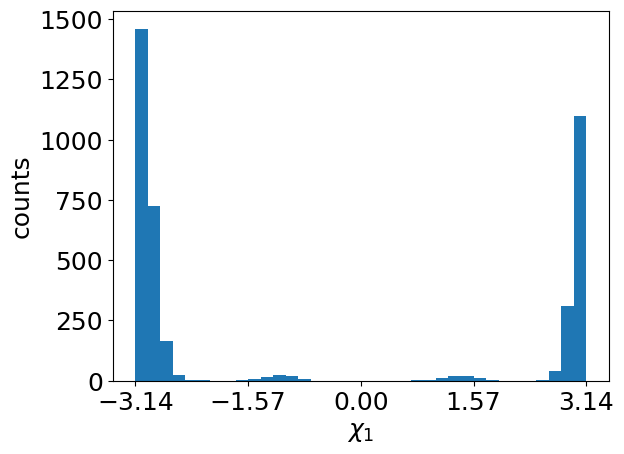

<Figure size 640x480 with 0 Axes>

In [24]:
for i in Val_resnums:
    print("Residue",i)
    plot_phipsi(i)
    plt.clf()
    plot_chi1(i)
    plt.clf()

***HOMEWORK Problem 3***

**Identify a residue that has 2 rotameric states and make representative snapshots to illustrate the 2 conformations (or a single snapshot with an overlay of two representative conformations).  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation.  Make a plot of the Chi 1 histogram (or Chi1/Chi2 if the residue has a Chi2 degree of freedom) and add a marking to the plot to indicate the dihedrals shown in your snapshot**



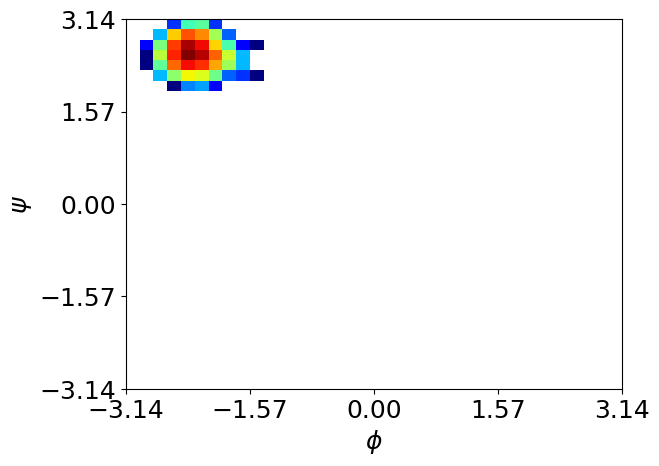

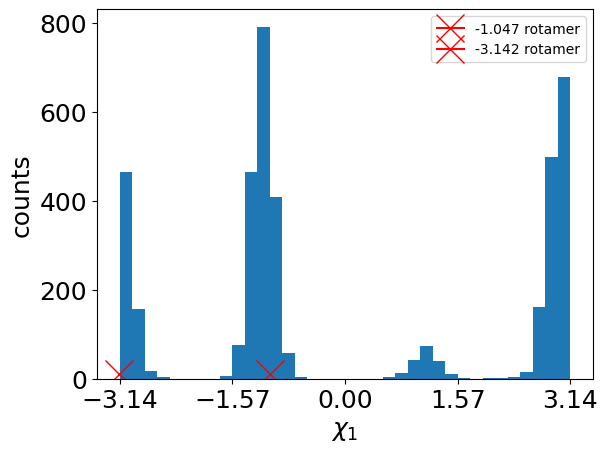

<Figure size 640x480 with 0 Axes>

In [25]:
#Using the code immediately above the Problem 3 question, we can see that Val 377 has two roughly equally populated rotamers 
#plots are replotted here to make it easier to see 

val = Val_resnums[12]

marker = [np.round(-np.pi/3, 3), np.round(-np.pi,3)]
plot_phipsi(val)
plot_chi1(val, marker)

We can again use VMD to visualize these rotamers. Since the positive and negative rotations of the same angle are related, we'll look at the conformations of -3.14 and -1.57 radians. We can first identify trajectory frames that show the different rotamers below:

In [26]:
#Finding frames of both rotamers 
#use the dihedral dictionary that has all of the relevant numbers 
rot1 = np.where((dihedral_dict["chi1"][i]<-0.9) & (dihedral_dict["chi1"][i]> -1.2))
rot2 = np.where((dihedral_dict["chi1"][i]< -3) & (dihedral_dict["chi1"][i]> -3.2))

print("Frames at -pi/3 rad:", rot1[0])
print("Frames at -3.14 rad:", rot2[0])

Frames at -pi/3 rad: [ 294  295  344  345  722  733  887  946 1069 1075 1236 1240 1459 1460
 1491 1820 1895 2271 2433 2620 2622 2623 2624 2721 2722 2860 2861 2863
 2976 3000 3001 3002 3003 3004 3022 3483 3484 3740 3856 3974]
Frames at -3.14 rad: [   6   12   13 ... 3991 3992 3996]


After identifying frames that show both conformations, we can make figures in VMD:

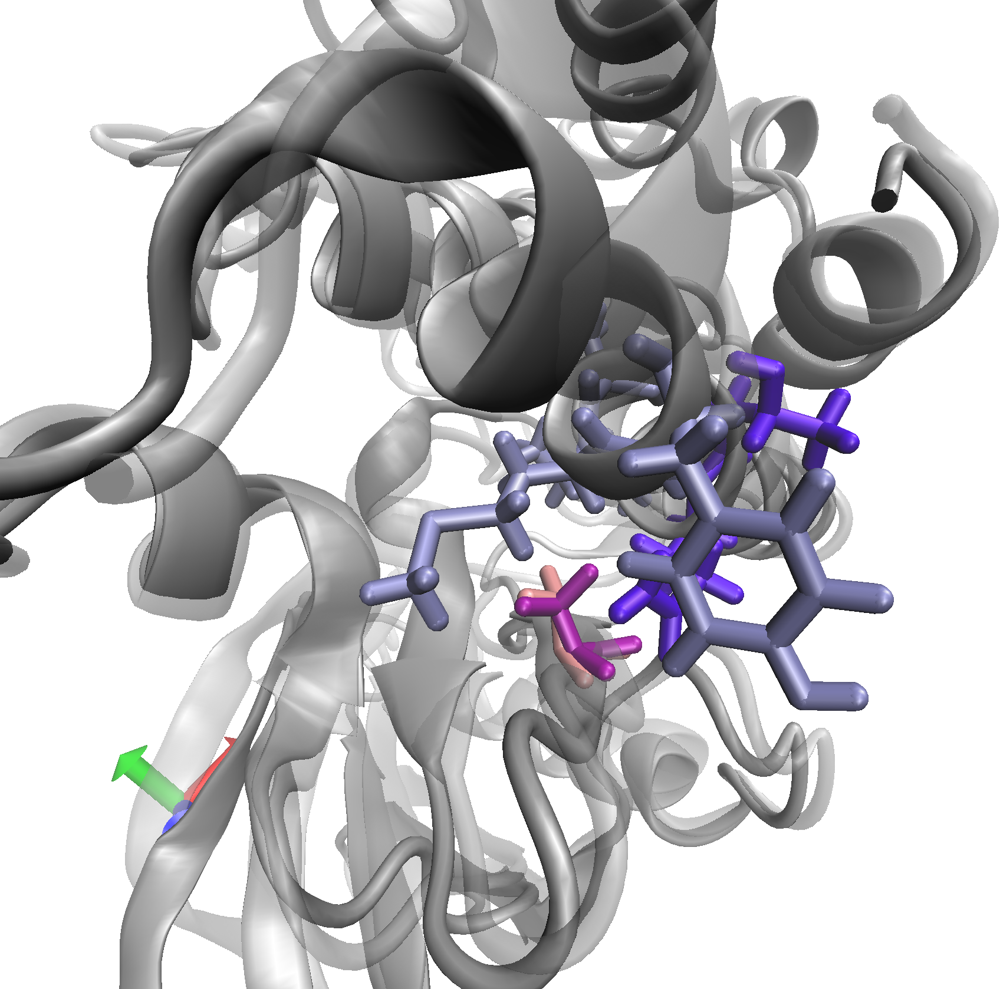

In [27]:
#loading in the images
image_path = outdir + "/Q3pt1.png"
img = Image.open(image_path)
display(img)

To orient: the white opaque structure shows frame 294, with the transparent structure showing frame 3991. Frame 294 is the more populated -pi/3 rotamer of VAL377, while frame 3991 is -pi. The pink residues are VAL377 (light pink is frame 294, dark pink is frame 3991). The nearby helical interactions are shown in licorice as well. In this snapshot, the helical residues are in frame 294 (favored), with hydrophobic residues in light blue and the polar residues in violet. This image shows both VAL377 rotamers, but to make it easier to look at the structural differences, lets look at one frame at a time.  

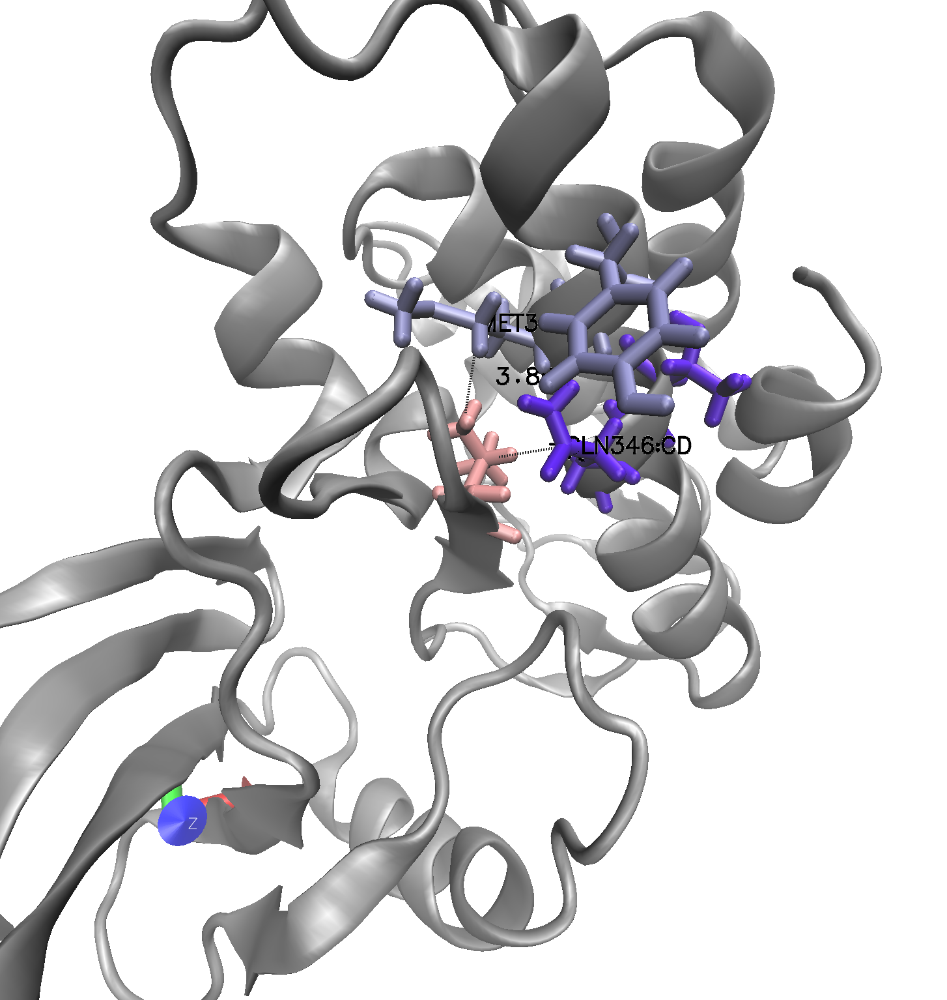

In [28]:
#frame 294
image_path = outdir + "/Q3_294.png"
img = Image.open(image_path)
display(img)

 
In looking at the favored state (frame 294), we can see a few interactions that might result in this state being more populated. For one, the -pi/3 rotamer seems to be oriented such that it interacts more with the long hydrophobic residues (as with the extended MET343 side chain) and is oriented away from the violet polar residues. The distance between VAL377 to MET343 is 3.86 and VAL377 to GLN346 is 3.89 (distances determined by looking at the nearest carbons). 

However, when VAL377 switches to the -pi rotamer, the hydrophobic side chain is oriented towards the polar GLN346 residue and further away from the hydrophobic MET343, which is not as favorable of an interaction. The new distances are 4.49 for MET to VAL and 3.82 for GLN to VAL.

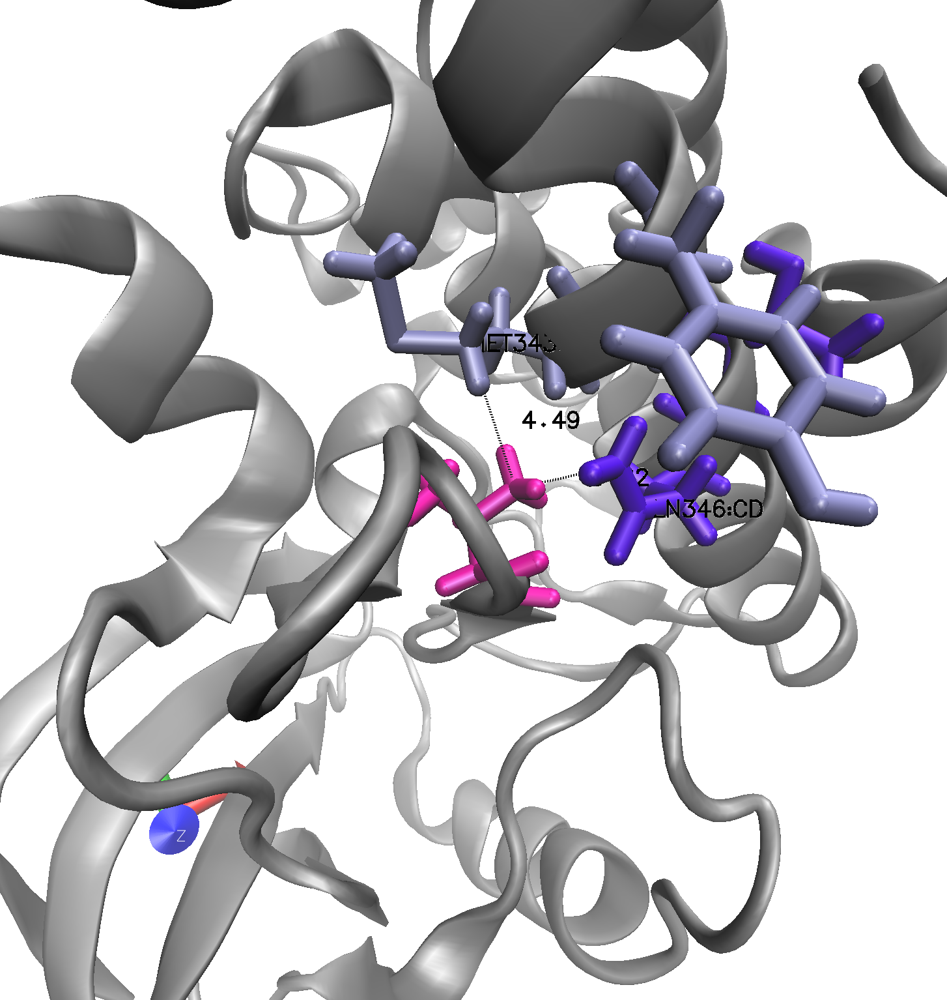

In [29]:
#frame 3991
image_path = outdir + "/Q3_3991.png"
img = Image.open(image_path)
display(img)


As mentioned above, the unfavorable frame 3991 shows how the helical residues are turned out, away from ALA377. The polar residues especially show a different orientation, as the polar-hydrophobic interaction is not favored. 

This causes the helical residues to orient away from the VAL/enclosed pocket, leading to a more open and slightly less favorable state. In addition, the -pi rotamer seems to cause some steric clash as the residues are pushed away from VAL377 and are occupying a crowded space.

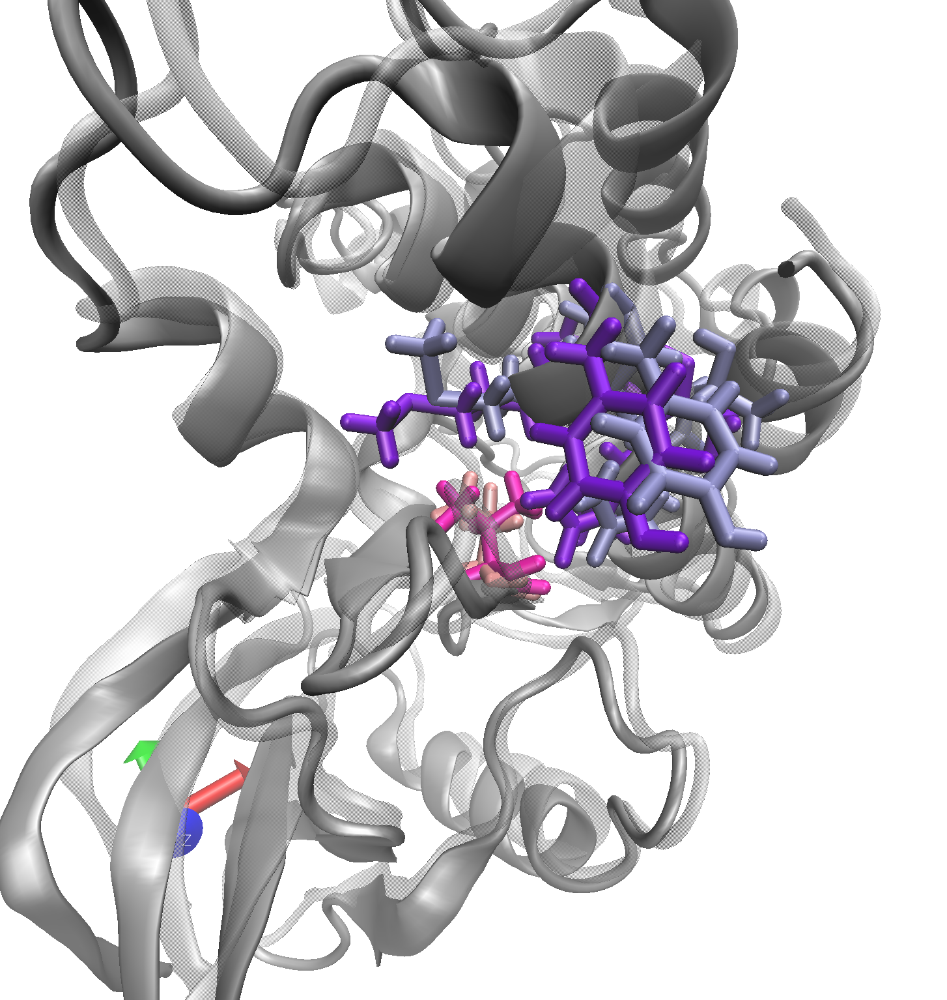

In [30]:
#looking at sterics of both frames
image_path = outdir + "/Q3_all.png"
img = Image.open(image_path)
display(img)


To orient: 
- opaque white structure is frame 294, transparent is 3991
- the iceblue helical residues are frame 3991, violet is frame 294
- the pink residues are VAL377, with light pink showing frame 294 and magenta showing frame 3991

***HOMEWORK Problem 4***

**Identify a residue that has 2 phi/psi free energy minima states and make representative snapshots to illustrate representative conformations (or a single snapshot with an overlay of two representative conformations).  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation.  Make a plot of the phi/psi histograms and add marking to the plot to indicate the phi/psi angles shown in your snapshot**


PHE493


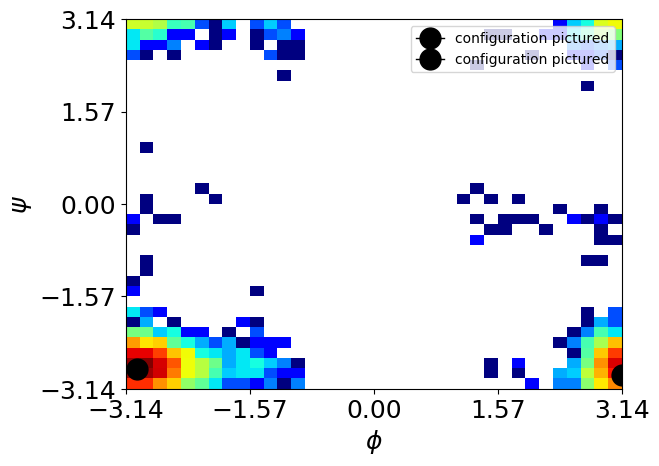

In [31]:
#similar process to problem 3 but looking at phi/psi angles rather than chi angles 
res = 251
res_index = res-242
print(sequence[res])
marker_phi = [np.pi,-3]
marker_psi = [-2.9, -2.8]
plot_phipsi(res, marker_phi, marker_psi)

GLY251 shows two basins at +3.14 and -3.14 radians for the phi angle and a psi angle of ~ -3 rad. Next we can find the frames and then visualize in VMD

In [32]:
#Now, we can find the frames that correspond to these two basins. 
basin1 = np.where((dihedral_dict["phi"][res]>3) & (dihedral_dict["phi"][res]< 3.14) 
                  &(dihedral_dict["psi"][res]< -2.8) & (dihedral_dict["psi"][res]>-3.1))

basin2 = np.where((dihedral_dict["phi"][res]>-3.14) & (dihedral_dict["phi"][res]< -2.9) 
                  &(dihedral_dict["psi"][res]< -2.7) & (dihedral_dict["psi"][res]>-2.9))

print("Frames in basin 1:", basin1[0])
print("Frames in basin 2:", basin2[0])

Frames in basin 1: [  37  148  207  226  232  234  236  237  257  262  264  265  287  323
  337  344  353  364  373  395  424  430  446  453  492  502  535  550
  551  567  577  588  597  623  646  669  702  749  759  762  764  780
  781  787  791  797  798  806  821  833  836  846  847  854  858  860
  877  896  898  913  930  946  953  966 1037 1048 1091 1217 1267 1269
 1274 1278 1295 1306 1307 1394 1462 1515 1545 1563 1581 1592 1706 1720
 1734 1766 1790 1864 1870 1903 1928 1944 2045 2059 2062 2087 2099 2126
 2127 2332 2345 2362 2380 2400 2429 2432 2478 2488 2552 2598 2643 2670
 2681 2692 2729 2756 2778 2839 2848 2870 2921 2975 3052 3078 3087 3156
 3170 3181 3259 3275 3407 3419 3428 3434 3517 3670 3728 3735 3754 3767
 3807 3825 3832 3833 3863 3898 3905 3942 3963 3973]
Frames in basin 2: [ 201  211  217  233  238  240  243  248  251  258  267  268  270  273
  276  277  279  280  290  291  294  305  321  322  333  341  356  357
  363  372  388  389  398  402  404  414  421  426  429  4

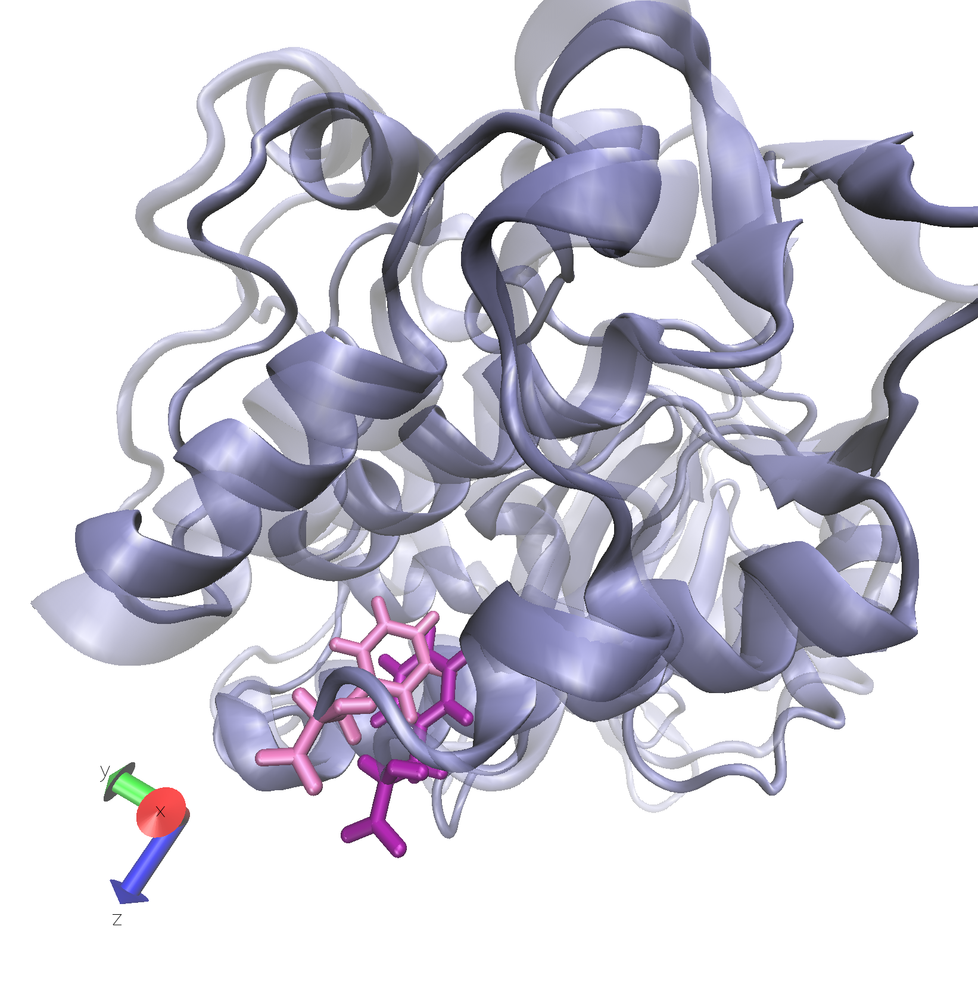

In [33]:
#loading the images
image_path = outdir + "/Q4_both.png"
img = Image.open(image_path)
display(img)

To show the phi/psi angles and find interactions that might result in basin 2 being more populated, I've created three images. The first one, shown above, demonstrates both phi/psi angles overlaid to visualize what the rotation looks like (between the +pi and -pi conformation) for the PHE493 residue. The residue seems to interact with a few residues on the nearby alpha helix, which are shown more in detail below. It's also interesting to note that PHE493 is the C terminus! 

All of the images compare frame 1545 (for the less populated basin 1) and frame 3760 for the more populated basin 2. In the image above, the transparent full protein is frame 1545 while the opaque structure is frame 3760. The light pink residue is frame 3760, while dark pink is 1545. Both frames show the full orientation switch of PHE493 between the two basins. Let's look at each of these two frames in more detail.

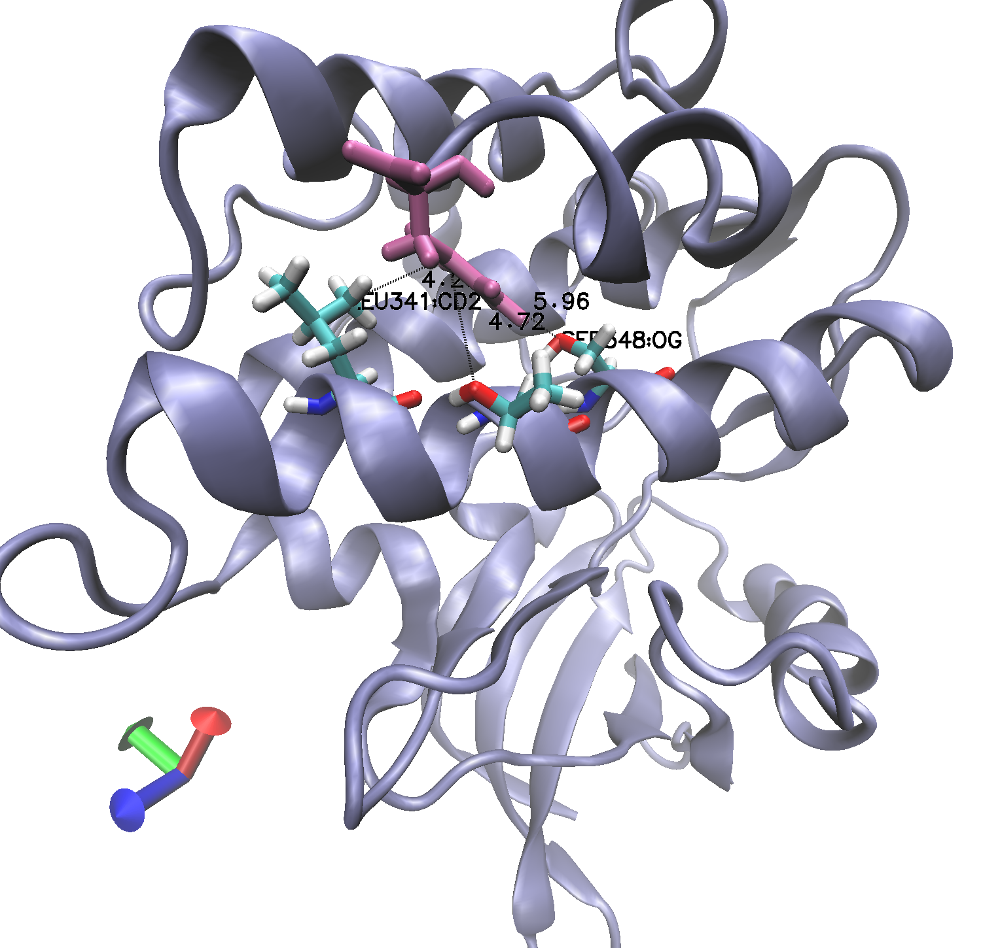

In [34]:
#frame 3760
image_path = outdir + "/Q4_3760.png"
img = Image.open(image_path)
display(img)

This image shows a conformation from basin 2 (frame 3760). 

To orient:
- pink residue is PHE493
- The left most residue on the helix is LEU341, as labeled. The middle is THR345, and the right most is SER348.
- The distances between PHE493 are shown and are also written here for clarity: PHE to LEU is 4.26A, PHE to THR is 4.72A, and PHE to SER is 5.96A. 

In this frame, the aromatic residue is oriented towards the hydrophobic methyl groups of LEU341, creating a pocket of hydrophobic interactions.

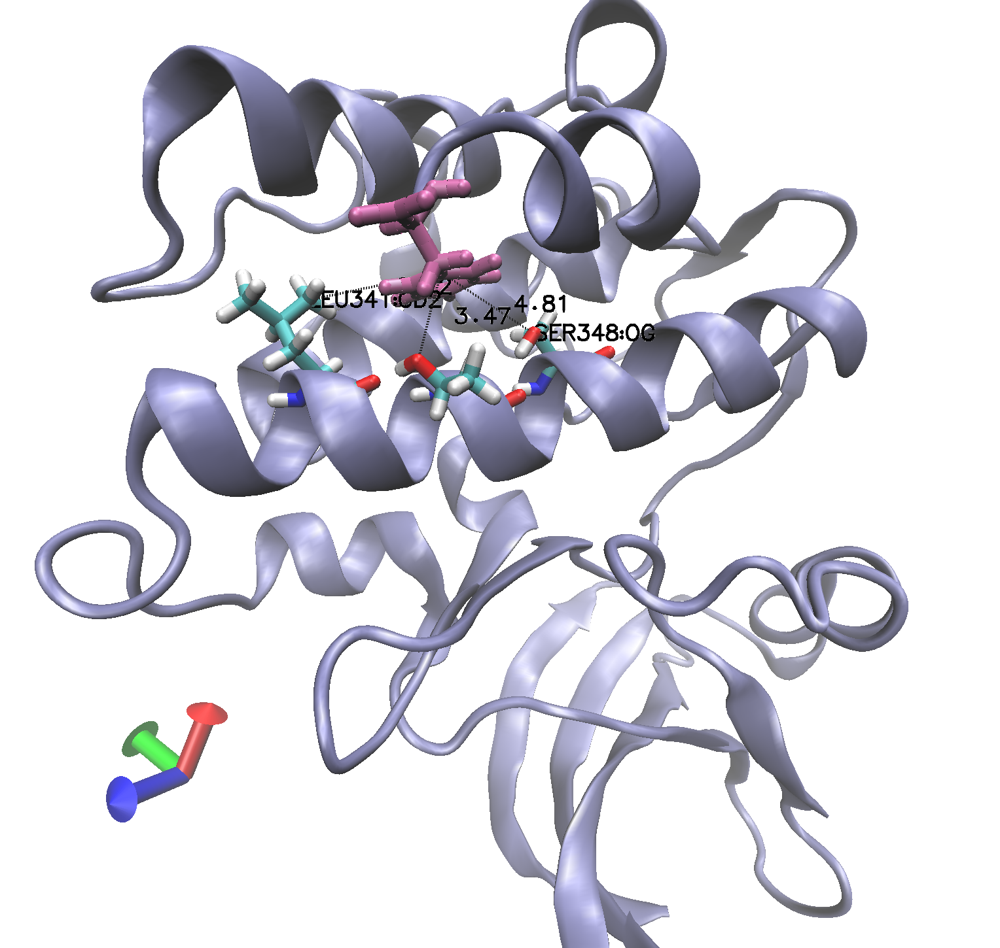

In [35]:
#frame 1545
image_path = outdir + "/Q4_1545.png"
img = Image.open(image_path)
display(img)

This image shows frame 1545 in basin 1. 

To orient:
- pink residue is PHE493
- The left most residue on the helix is LEU341, as labeled. The middle is THR345, and the right most is SER348.
- The distances between PHE493 are shown and are also written here for clarity: PHE to LEU is 6.12, PHE to THR is 3.47, and PHE to SER is 4.81. 

In this frame, the aromatic residue is oriented towards the electronegative oxygen and carbonyls of THR and SER. This interaction almost reminds me of pi-stacking intearctions. While there is of course no pi-stacking here, the aromatic residue and electronic network in the ring is interacting with the electronegative oxygen and electropositive carbon in the carbonyl. However, given that this is not actually pi stacking, this interaction is perhaps not as strong as the hydrophobic interaction in Frame 3760 between PHE493 and LEU341, resulting in this basin being populated with less frames. 

***Challenge Problem 2***

**Identify a residue with phi/psi basins that favor distinct rotamers and make a plot of chi distributions for different regions of the phi/psi basins**


Residue 255


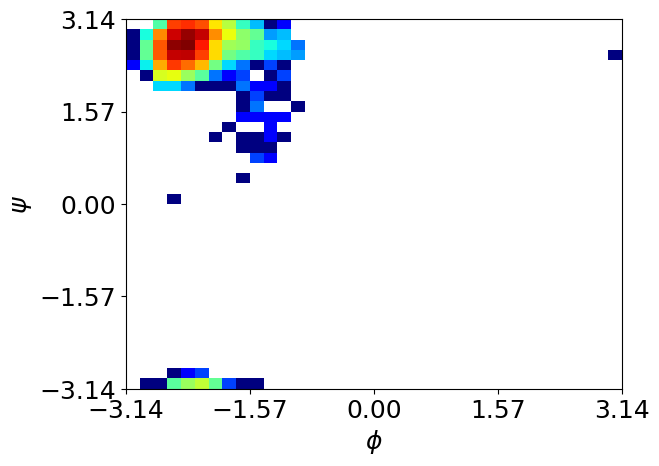

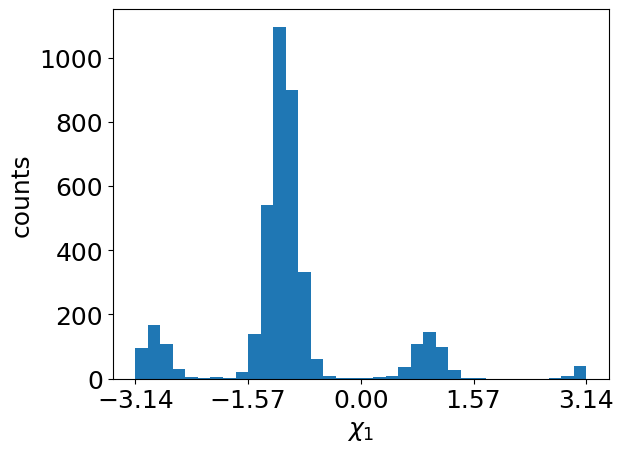

Residue 258


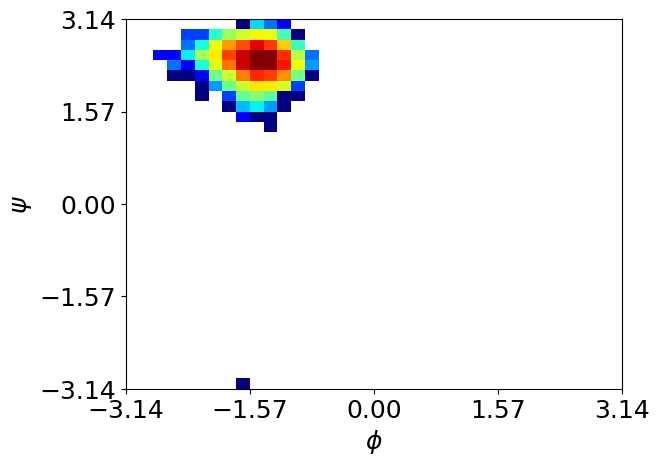

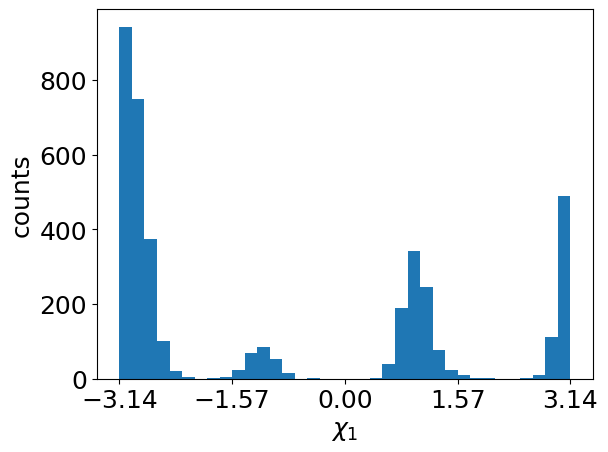

Residue 275


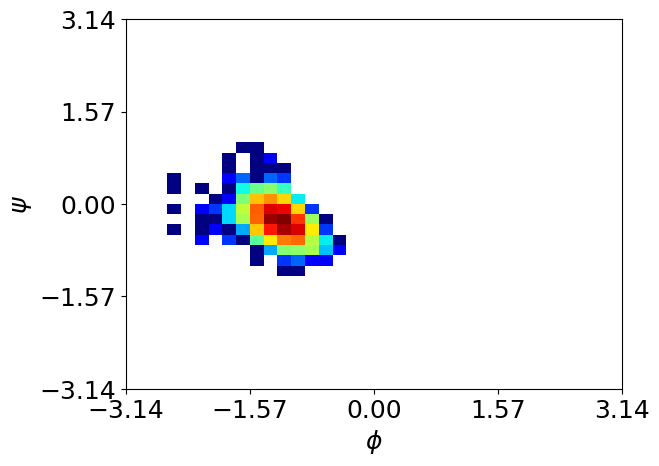

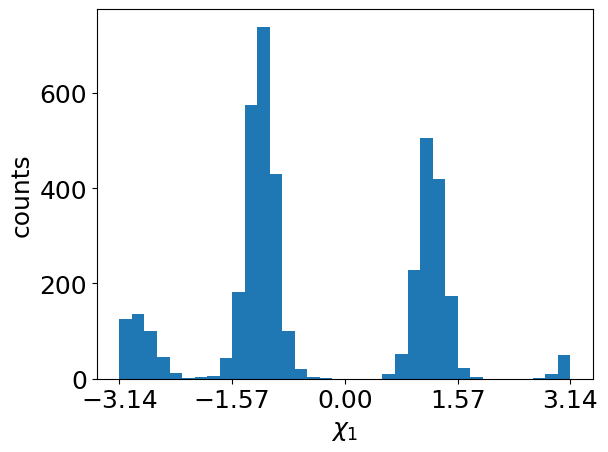

Residue 279


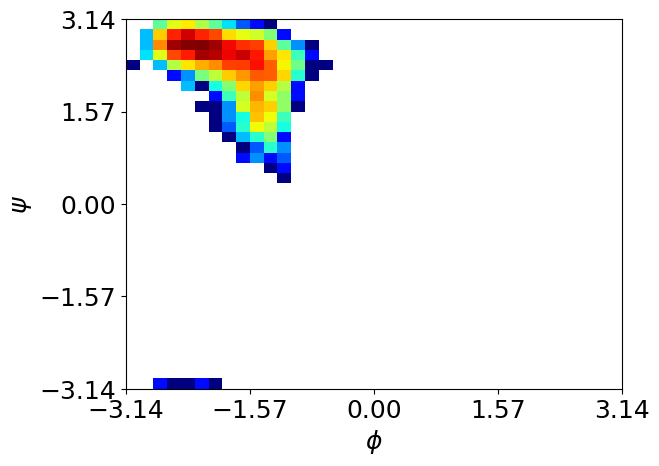

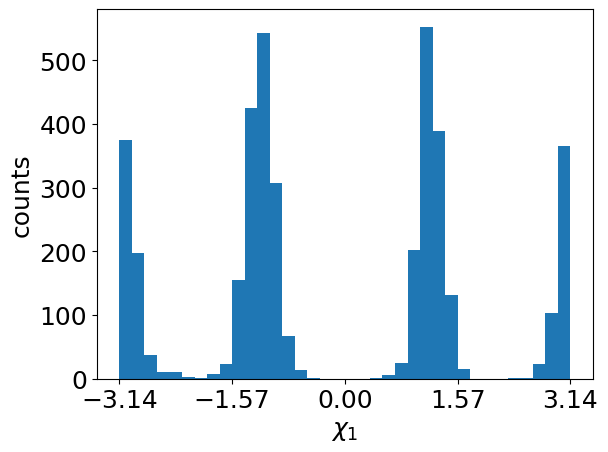

Residue 281


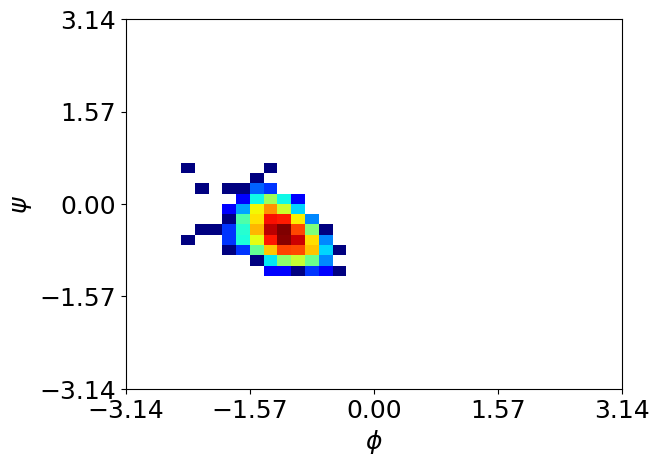

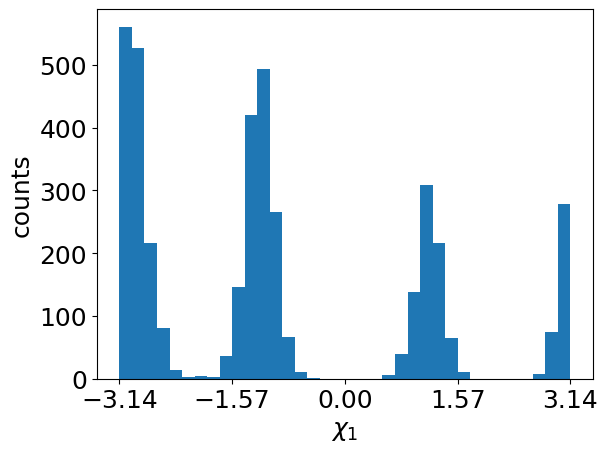

Residue 282


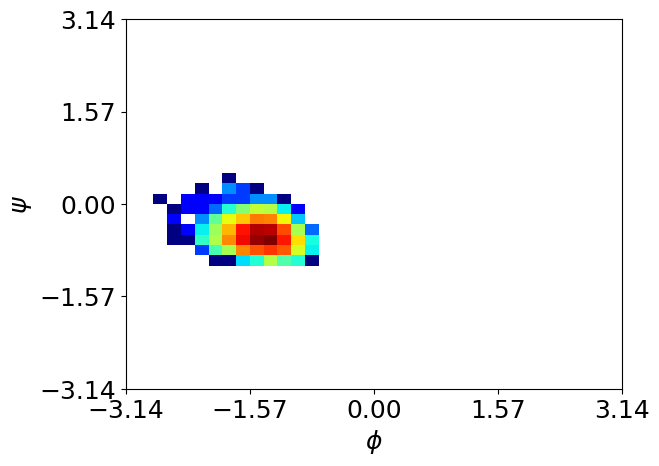

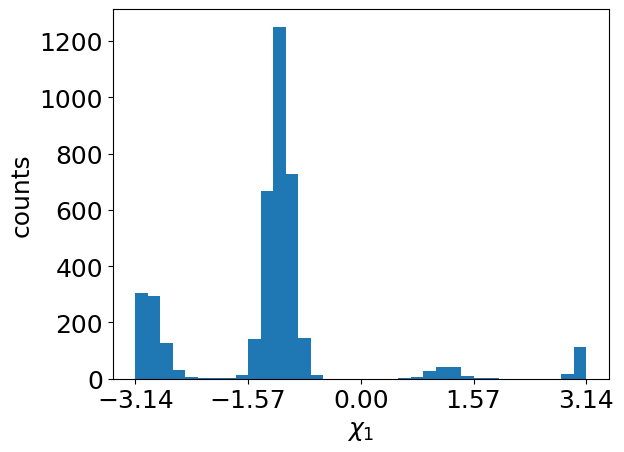

Residue 286


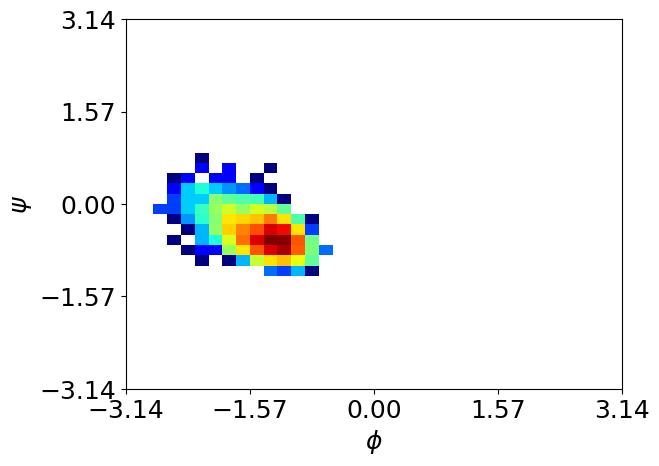

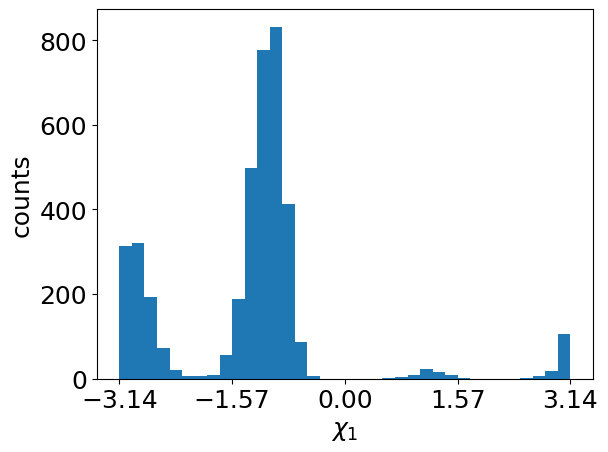

Residue 292


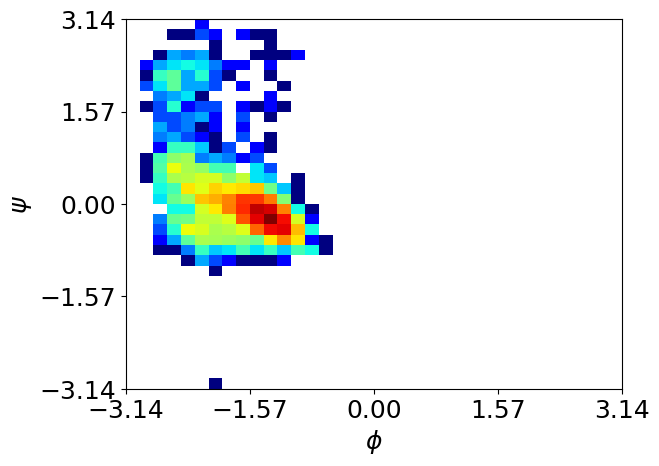

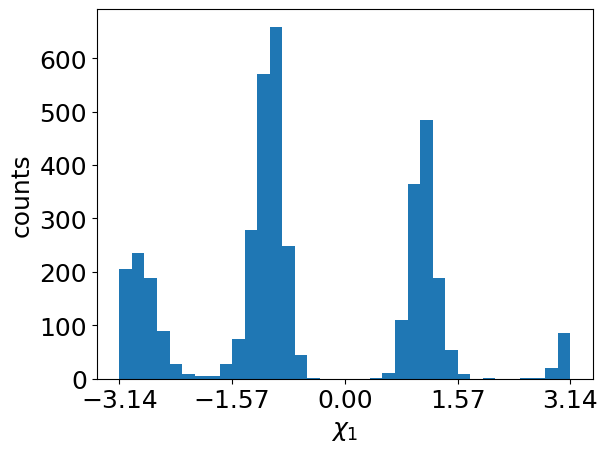

Residue 308


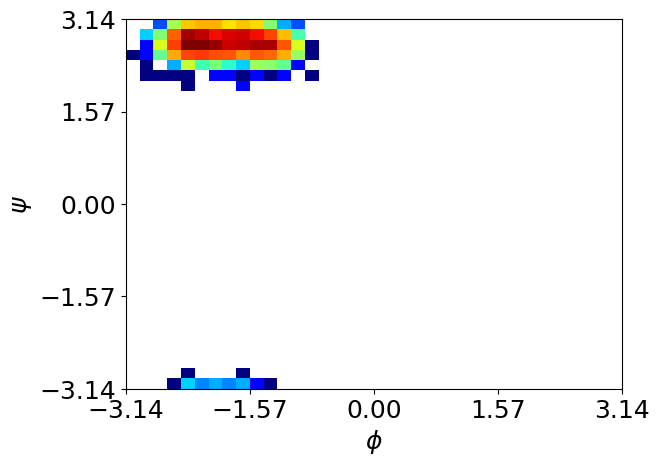

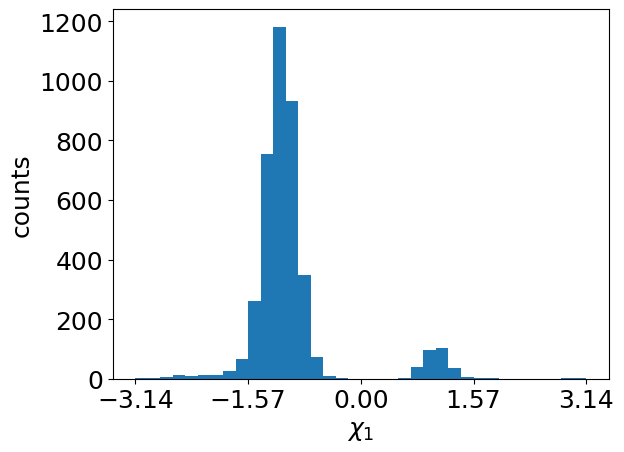

Residue 316


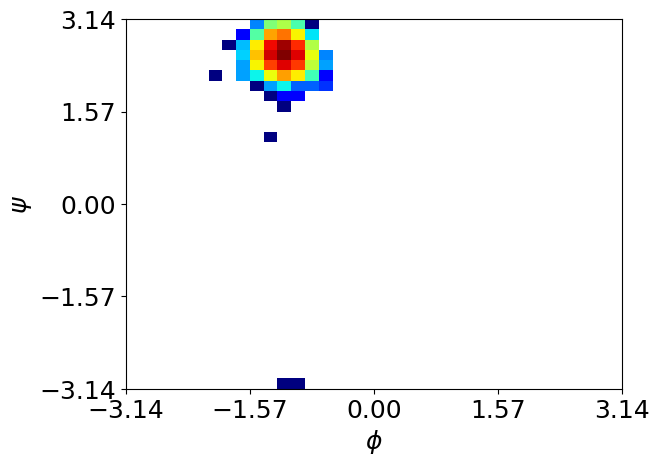

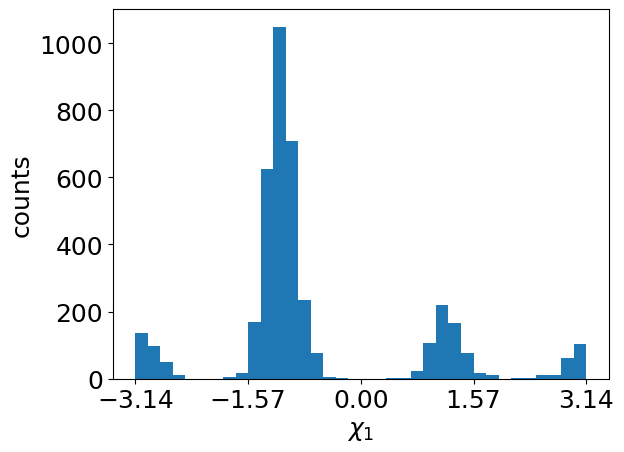

Residue 329


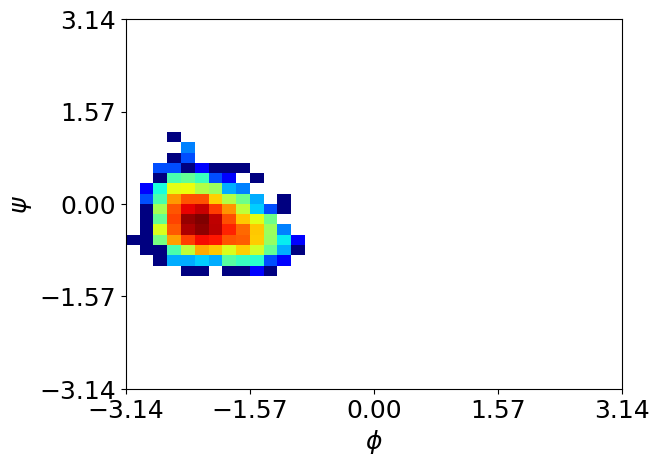

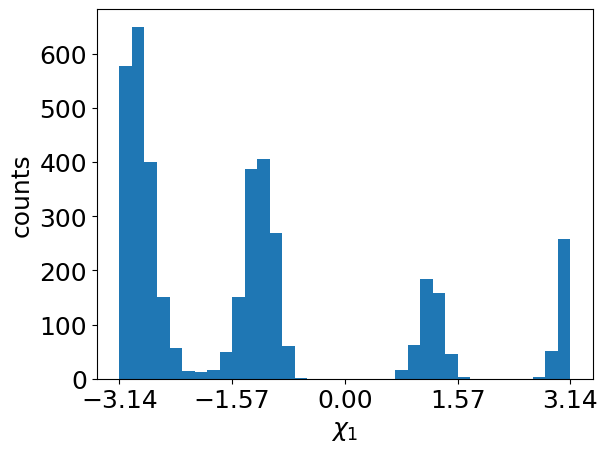

Residue 334


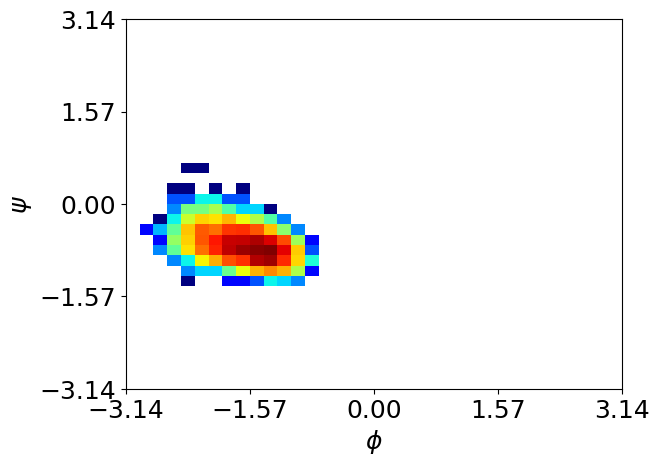

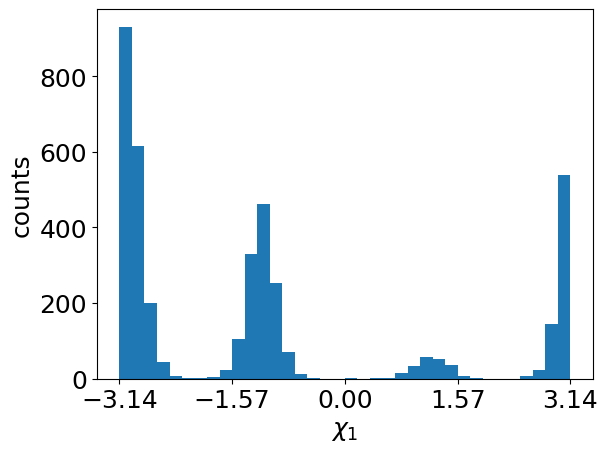

Residue 352


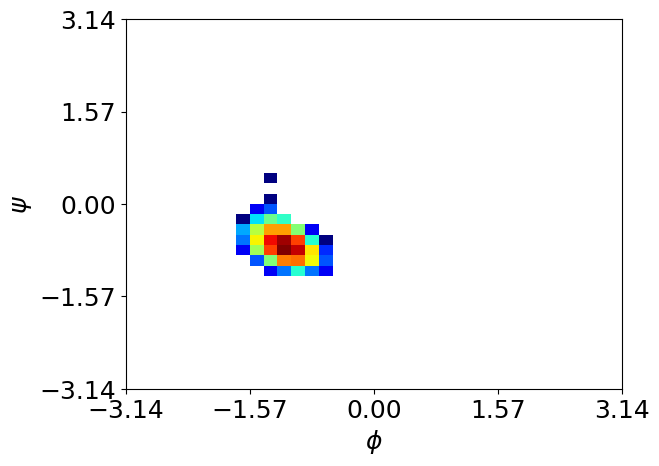

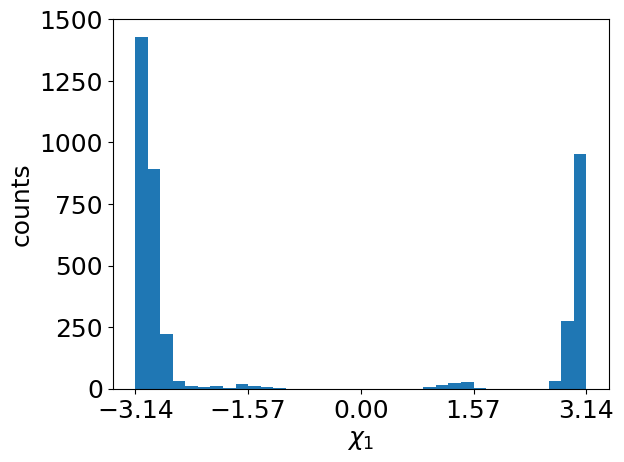

Residue 355


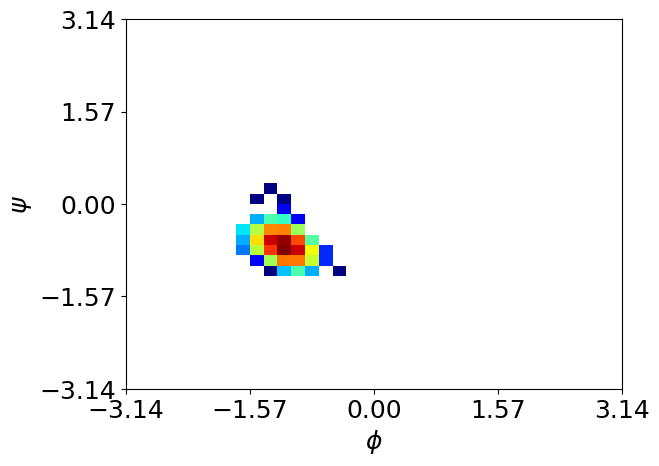

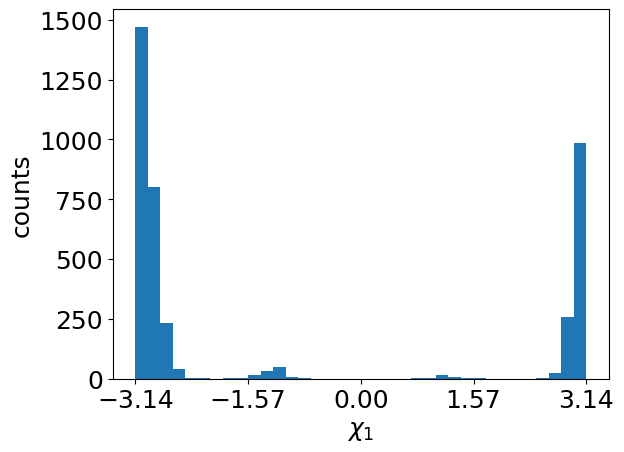

Residue 373


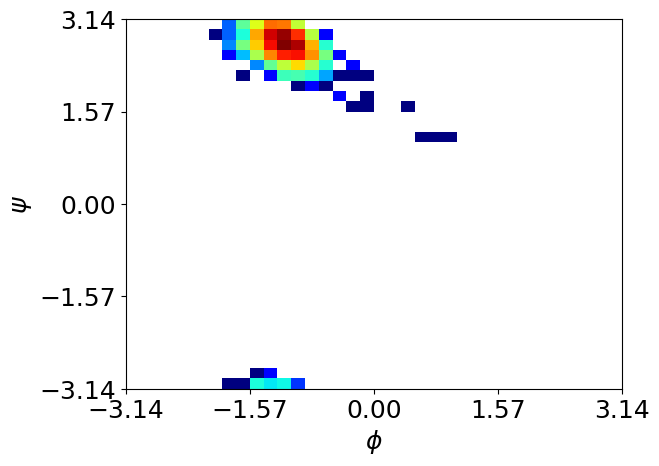

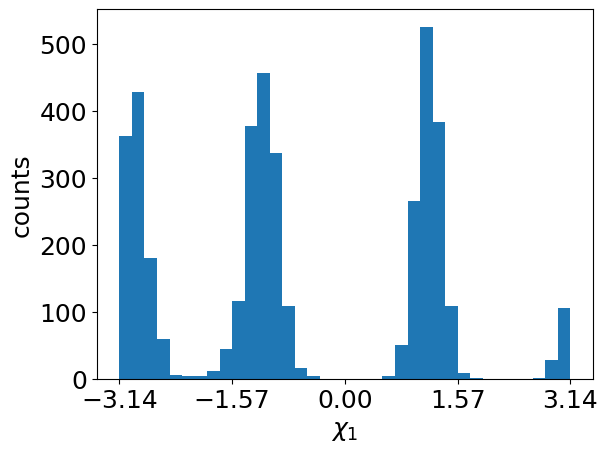

Residue 409


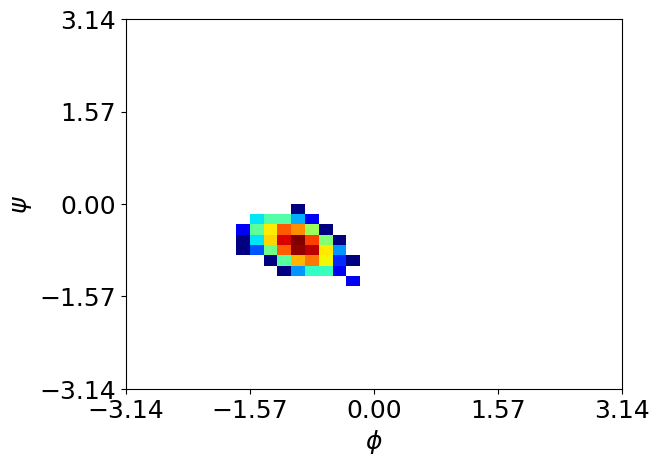

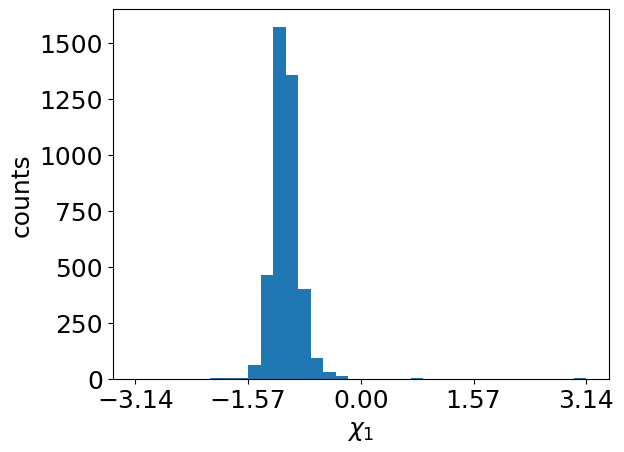

Residue 431


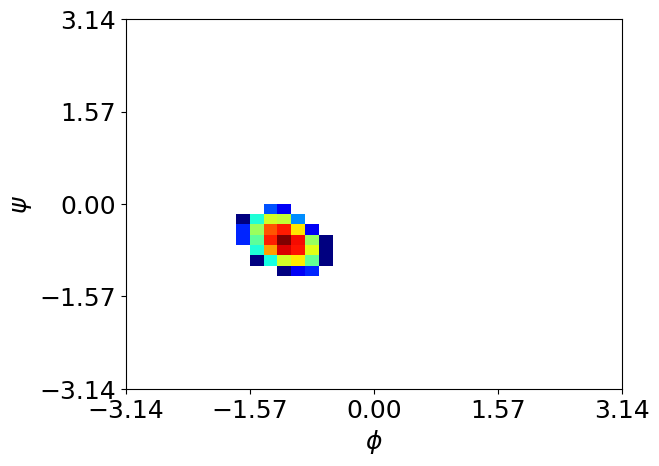

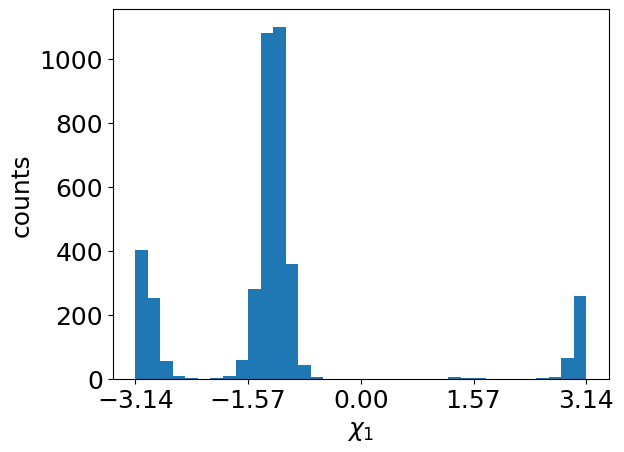

Residue 450


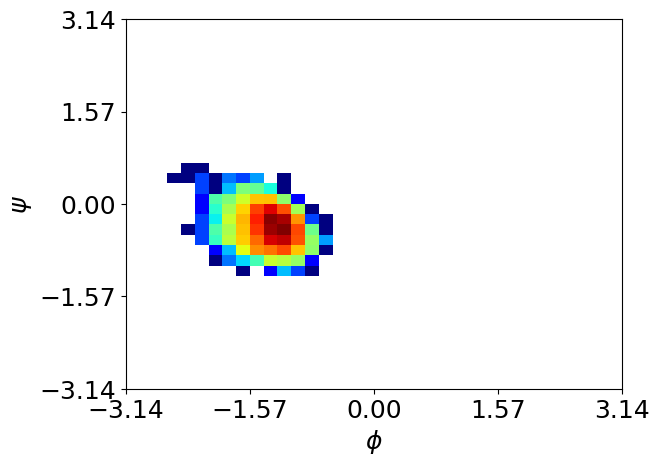

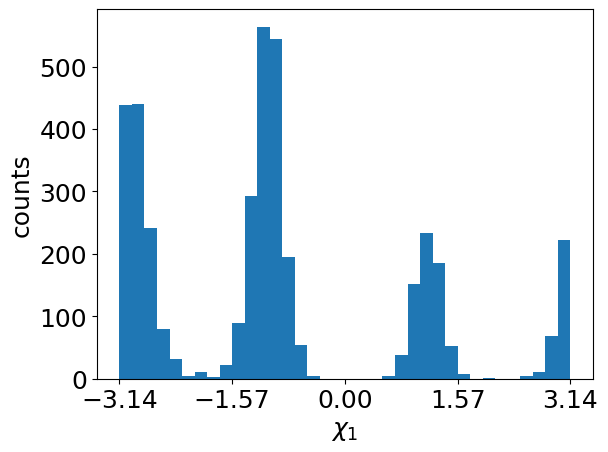

Residue 453


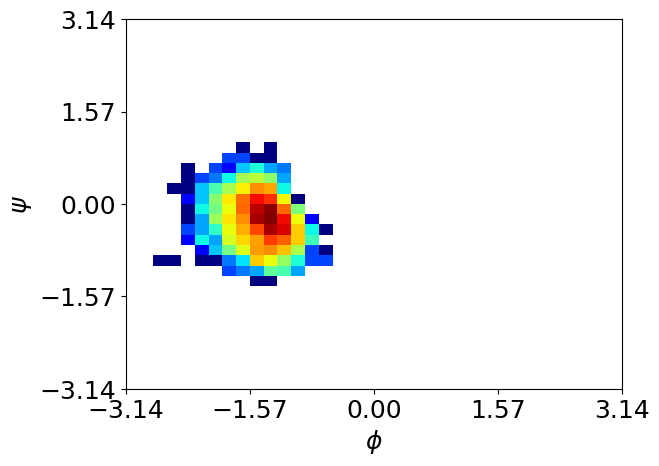

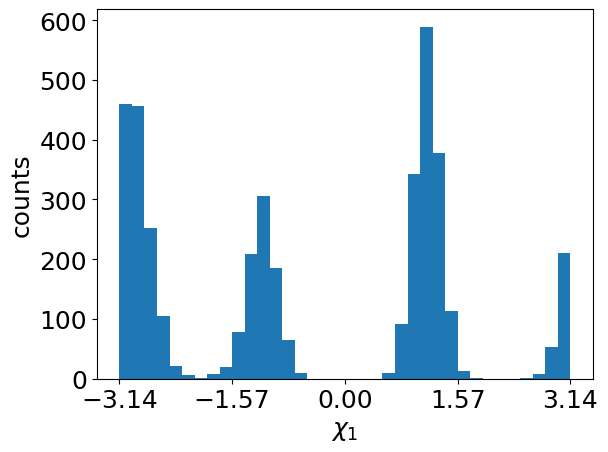

Residue 459


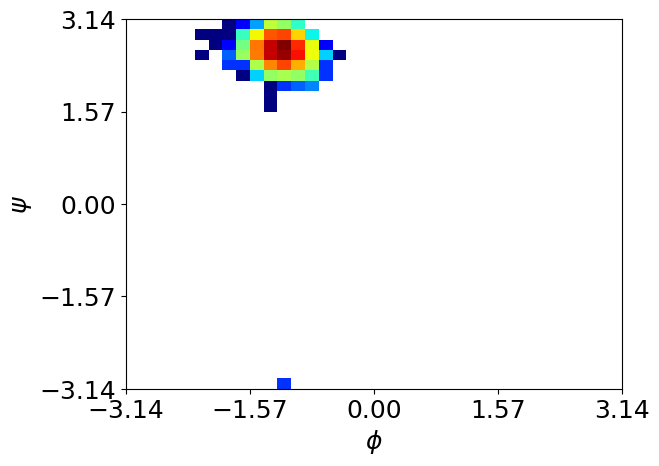

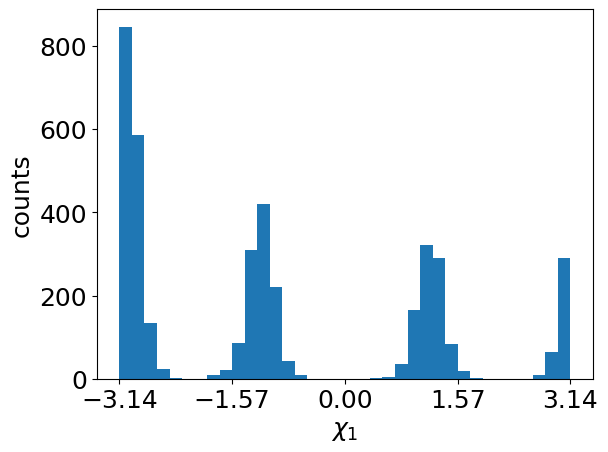

Residue 462


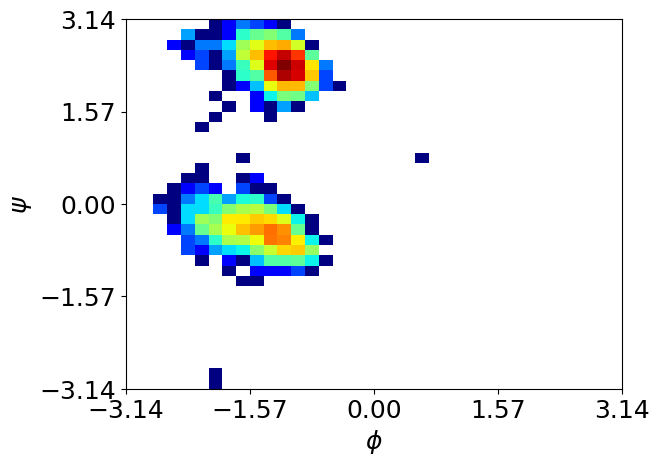

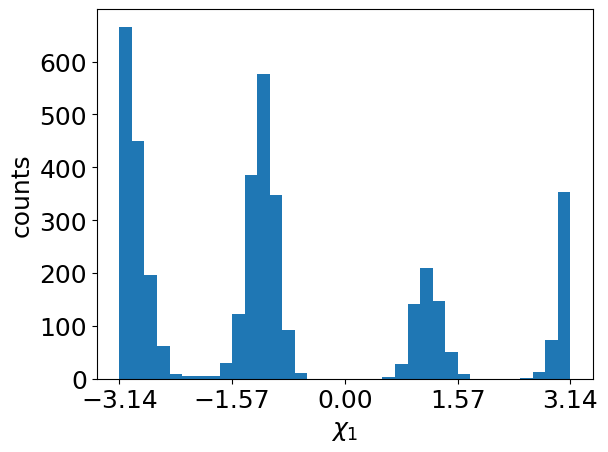

Residue 466


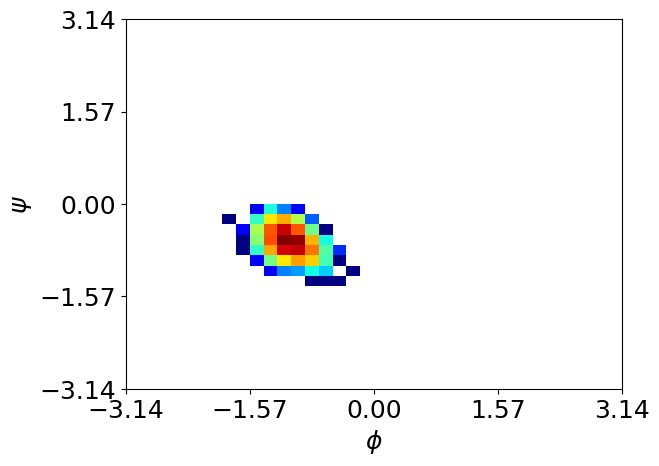

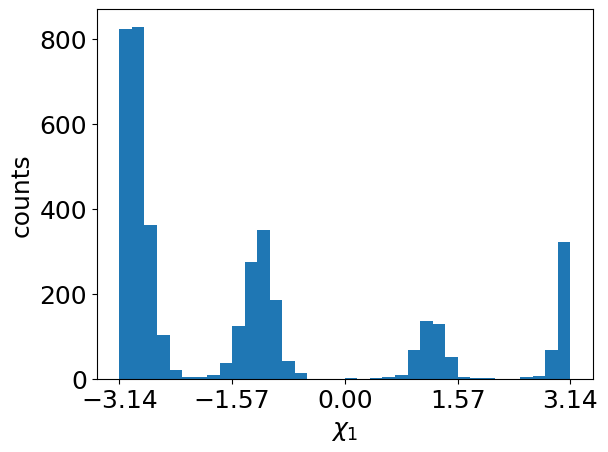

Residue 470


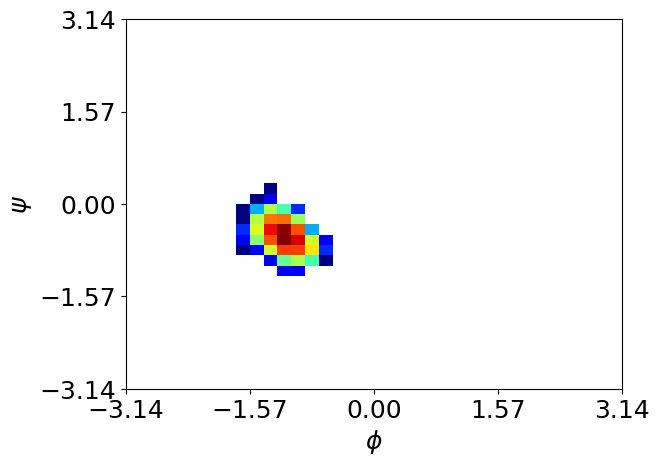

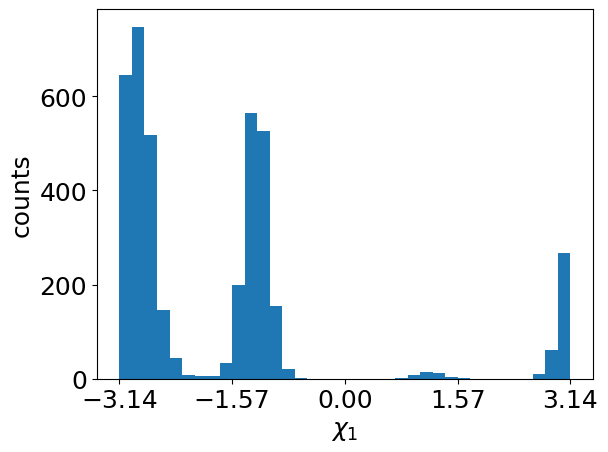

Residue 488


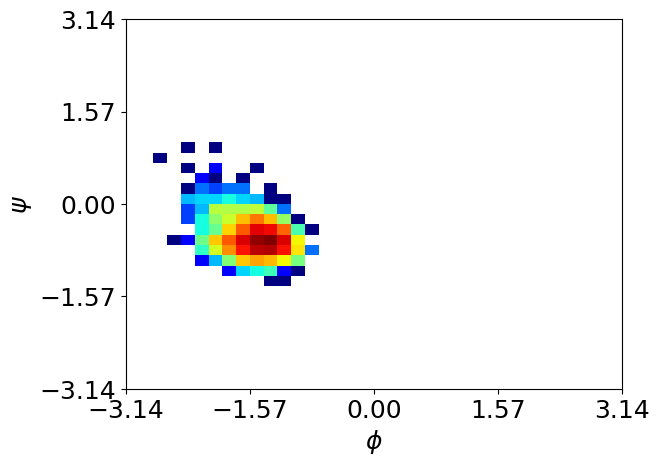

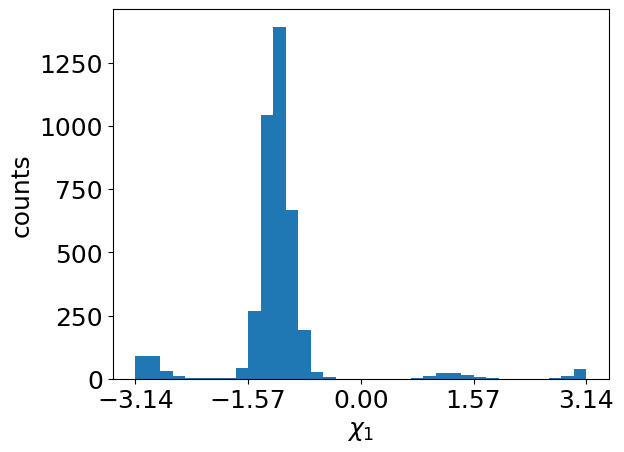

<Figure size 640x480 with 0 Axes>

In [36]:
#borrowing code from above to find an option
#choosing to look at charged amino acids that have the option to be more solvent exposed 
#let's look at GLU
GLU_indices=np.where(resnames=='GLU')
Glu_resnums=resnums[GLU_indices]

for i in Glu_resnums:
    print("Residue",i)
    plot_phipsi(i)
    plt.clf()
    plot_chi1(i)
    plt.clf()


GLU 462 has two basins in the phi/psi plot and shows two distinct rotamers. Plotting this residue specifically below to make it easier to see.

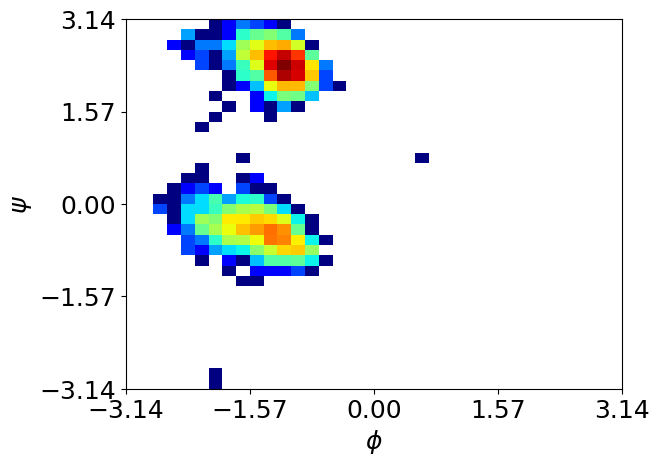

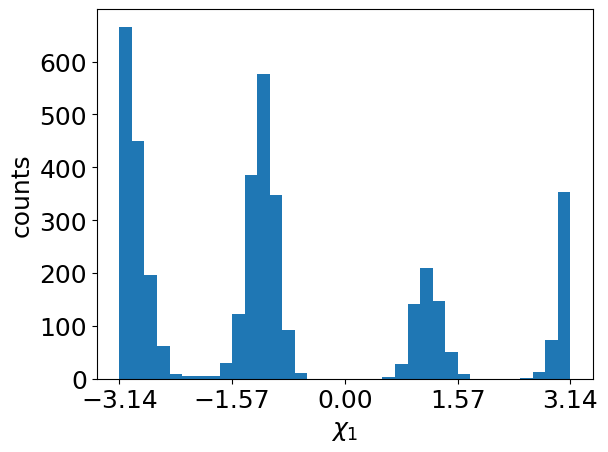

<Figure size 640x480 with 0 Axes>

In [37]:
res = Glu_resnums[20]
plot_phipsi(res)
plot_chi1(res)

In [38]:
#Plot chi distributions for different regions
#Let's plot the chi distributions for both regions 
#region 1 is the upper basin 

#first find the frames that correspond with the upper basin 
upper = np.where((dihedral_dict["phi"][res]>-2.5) & (dihedral_dict["phi"][res]< -0.5) 
                  &(dihedral_dict["psi"][res]< 3.14) & (dihedral_dict["psi"][res]>1.57))
lower = np.where((dihedral_dict["phi"][res]>-2.5) & (dihedral_dict["phi"][res]< -0.5) 
                  &(dihedral_dict["psi"][res]< 0.5) & (dihedral_dict["psi"][res]>-1.57))
print("Frames in upper basin:", upper[0])
print("Frames in lower basin:", lower[0])

Frames in upper basin: [   0    1    2 ... 3864 3865 3866]
Frames in lower basin: [ 101  102  103 ... 3997 3998 3999]


Now, we can use these frames to plot chi distributions that match the basins. 

In [39]:
#Chi1 angles for the residue 
chi1 = dihedral_dict["chi1"][462]
upperval = upper[0]

#Modify the array so the index is paired with the chi value, since index is the frame number that corresponds to frames in upperval
indexed_chi1 = list(enumerate(chi1))

#Picking out frames from chi angles that are in upperval 
upper_chi = []
for index, value in indexed_chi1:
    if index in upperval:
        upper_chi.append(value)

upper_chi = np.array(upper_chi)
print(len(upper_chi))
print(len(upperval))

2549
2549


Now that we have the frames that match the upper basin (and we confirmed that both arrays are the same size just to check), we can plot the distribution!

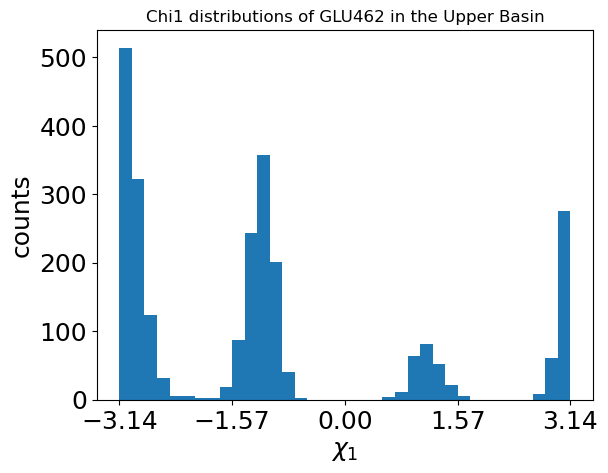

<Figure size 640x480 with 0 Axes>

In [40]:
#Plotting the chi distribution for upper basin
plt.hist(upper_chi,bins=36,range=[-3.14,3.14])        
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.xlabel('$\chi_1$', size=18)
plt.ylabel('counts', size=18)
plt.tick_params(labelsize=18)
plt.title("Chi1 distributions of GLU462 in the Upper Basin")
plt.show()
plt.clf()  


Now we can repeat the process for the lower basin.

In [41]:
#Chi1 angles for the residue 
lower_val = lower[0]

lower_chi = []

for index, value in indexed_chi1:
    if index in lower_val:
        lower_chi.append(value)

lower_chi = np.array(lower_chi)
print(len(lower_chi))
print(len(lower_val))

1431
1431


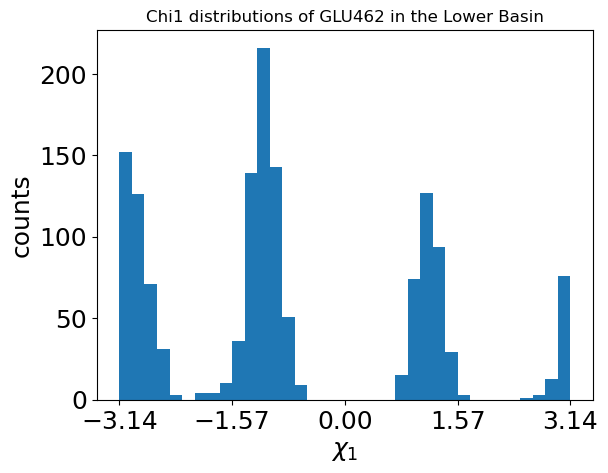

<Figure size 640x480 with 0 Axes>

In [42]:
#chi distributions
plt.hist(lower_chi,bins=36,range=[-3.14,3.14])   
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.xlabel('$\chi_1$', size=18)
plt.ylabel('counts', size=18)
plt.tick_params(labelsize=18)
plt.title("Chi1 distributions of GLU462 in the Lower Basin")
plt.show()
plt.clf()  

Looks like in the lower basin, the -1.57 rad chi angle is preferred, while in the upper basin, the -3.14 rad angle is preferred.